Ayoola Ogunbona <br>
Cody Padlo <br>
Soraya Karimi <br>

MSDS 422 <br>
Professor Anil Chaturvedi

# Module 2 Assignment 1: Housing Price Indicators

# Import Libraries

In [1]:
!pip install pygam
!pip install mlxtend

In [2]:
from google.colab import drive
import itertools
import matplotlib.pyplot as plt
from mlxtend.feature_selection import SequentialFeatureSelector
import numpy as np
import pandas as pd
import pygam
from pygam import LinearGAM
from pygam import s
import scipy
import scipy.stats as stats
from scipy.stats import linregress
import seaborn as sns
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import tensorflow as tf
import tensorflow_decision_forests as tfdf

In [3]:
print("TensorFlow v" + tf.__version__)
print("TensorFlow Decision Forests v" + tfdf.__version__)

TensorFlow v2.18.0
TensorFlow Decision Forests v1.11.0


# Display Adjustments

In [4]:
#%matplotlib inline

# Mount Google Drive

In [5]:
# note that the shared folder has to be added as a shortcut to "My Drive"
drive.mount('/content/drive')
project_path = '/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 2: Housing Price Indicators/house-prices-advanced-regression-techniques/'

Mounted at /content/drive


# Load Data

In [6]:
train_file_path = project_path + "train.csv"
train_df = pd.read_csv(train_file_path)
print("Full train dataset shape is {}".format(train_df.shape))

Full train dataset shape is (1460, 81)


In [7]:
test_file_path = project_path + "test.csv"
test_df = pd.read_csv(train_file_path)
print("Full test dataset shape is {}".format(test_df.shape))

Full test dataset shape is (1460, 81)


# Initial Review

## Descriptive Statistics

1. Provide appropriate descriptive statistics and visualizations to help understand the marginal distribution of the dependent variable.

In [8]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [10]:
for column in train_df.columns:
  print(column)
  print(train_df[column].describe())

Id
count    1460.000000
mean      730.500000
std       421.610009
min         1.000000
25%       365.750000
50%       730.500000
75%      1095.250000
max      1460.000000
Name: Id, dtype: float64
MSSubClass
count    1460.000000
mean       56.897260
std        42.300571
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64
MSZoning
count     1460
unique       5
top         RL
freq      1151
Name: MSZoning, dtype: object
LotFrontage
count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
LotArea
count      1460.000000
mean      10516.828082
std        9981.264932
min        1300.000000
25%        7553.500000
50%        9478.500000
75%       11601.500000
max      215245.000000
Name: LotArea, dtype: float64
Street
count     1460
unique       2
top       Pave
freq 

## Variable Category

We are using variable "SalePrice" as the dependent variable. We specifically determine correlation to this variable, first.

In [11]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [12]:
# Continous Variables
continous_vars = ['SalePrice',
                  'LotFrontage', 'LotArea',
                  'YearBuilt', 'YearRemodAdd',
                  'MasVnrArea',
                  'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                  '1stFlrSF', '2ndFlrSF',
                  'LowQualFinSF',
                  'GrLivArea',
                  'GarageYrBlt', 'GarageArea',
                  'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
                  '3SsnPorch', 'ScreenPorch', 'PoolArea'
                 ]

In [13]:
# Discrete Variables
discrete_vars = ['SalePrice',
                 'BsmtFullBath', 'BsmtHalfBath',
                 'FullBath', 'HalfBath',
                 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd',
                 'Fireplaces',
                 'GarageCars',
                 'MoSold', 'YrSold'
                ]

In [14]:
# Categorical Variables
categorical_vars = ['SalePrice',
                    'MSSubClass', 'MSZoning',
                    'Street', 'Alley',
                    'LotShape', 'LandContour',
                    'Utilities',
                    'LotConfig', 'LandSlope',
                    'Neighborhood',
                    'Condition1', 'Condition2',
                    'BldgType', 'HouseStyle',
                    'OverallQual', 'OverallCond',
                    'RoofStyle', 'RoofMatl',
                    'Exterior1st', 'Exterior2nd',
                    'MasVnrType',
                    'ExterQual', 'ExterCond',
                    'Foundation',
                    'BsmtQual', 'BsmtCond', 'BsmtExposure',
                    'BsmtFinType1', 'BsmtFinType2',
                    'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
                    'KitchenQual',
                    'Functional',
                    'FireplaceQu',
                    'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
                    'PavedDrive',
                    'PoolQC',
                    'Fence',
                    'MiscFeature', 'MiscVal',
                    'SaleType', 'SaleCondition'
                   ]

## Correlation Analysis

In [15]:
cont_corr = train_df[continous_vars].corr()

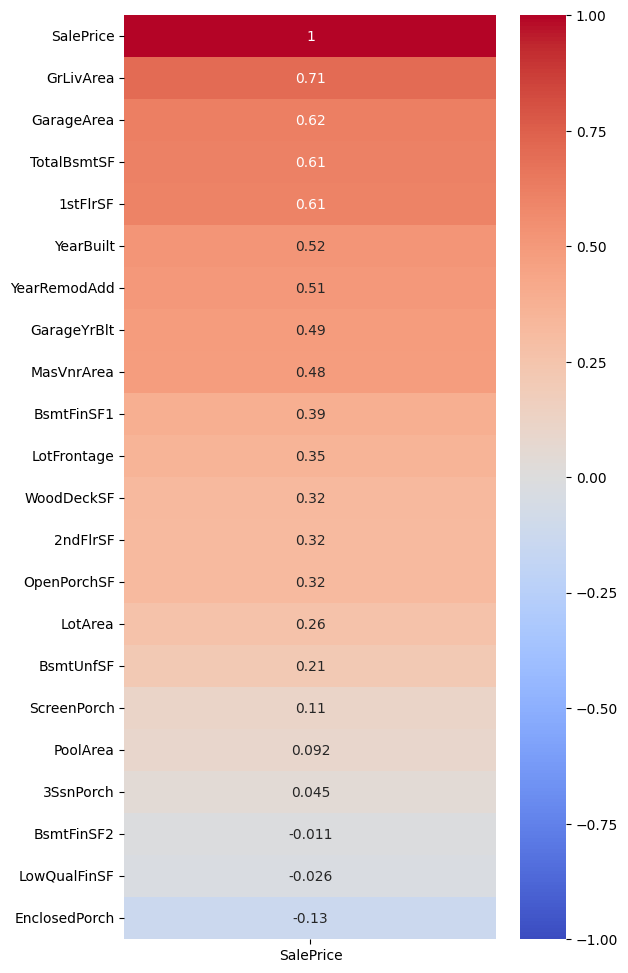

In [16]:
plt.figure(figsize=(6, 12))
sns.heatmap(cont_corr[['SalePrice']].sort_values(
                                            by='SalePrice',
                                            ascending=False
                                           ),
            cmap="coolwarm",
            annot=True,
            vmin=-1,
            vmax=1
           )
plt.show()

We can see that the numerical variables GrLivArea, GarageArea, 1stFlrSF, and YearRemodAdd are a few variables that are positively and strongly correlated with Sales Price. A scatterplot can be used to better visualize the relationship between each of these chosen three variables and SalesPrice

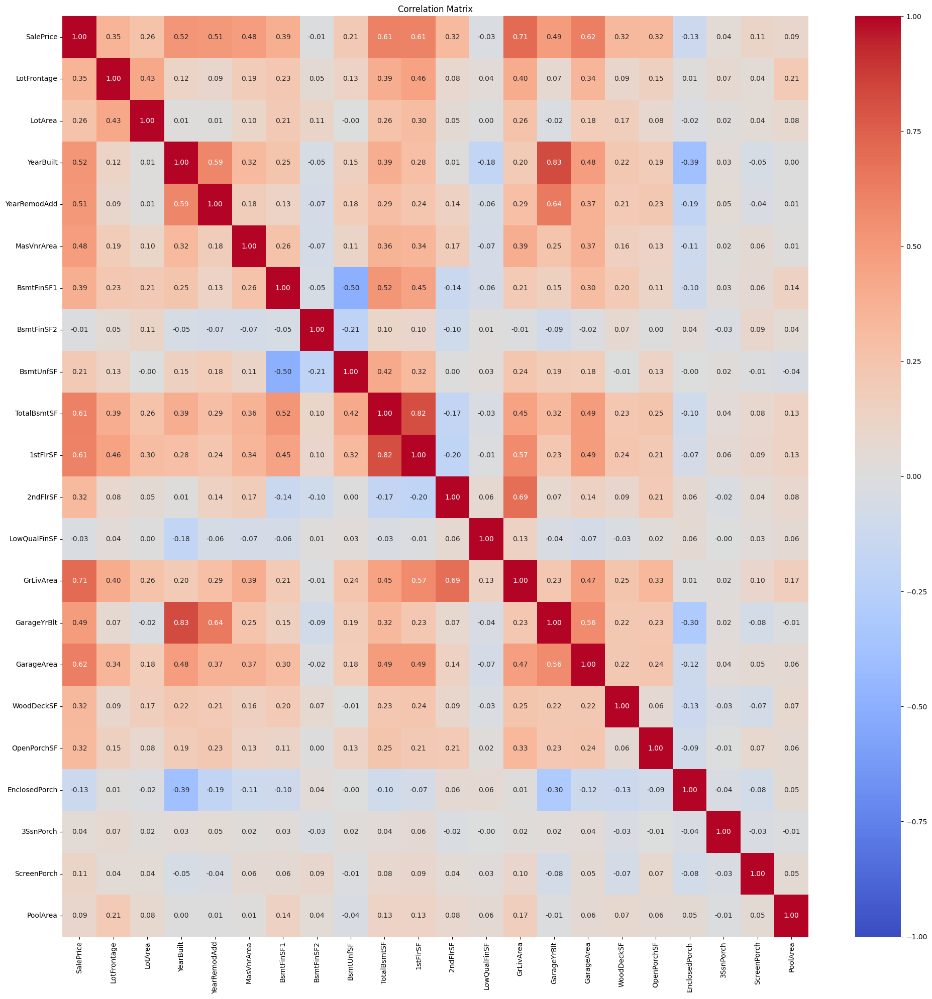

In [17]:
plt.figure(figsize=(20, 20))
sns.heatmap(cont_corr,
            annot=True,
            vmin=-1,
            vmax=1 ,
            cmap='coolwarm',
            fmt=".2f")
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

## Outlier Analysis

### Continous Variables

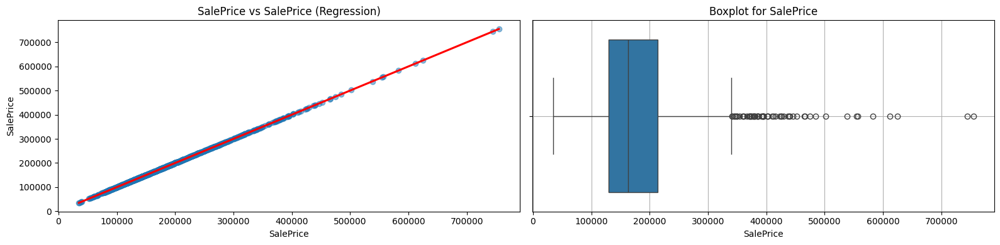

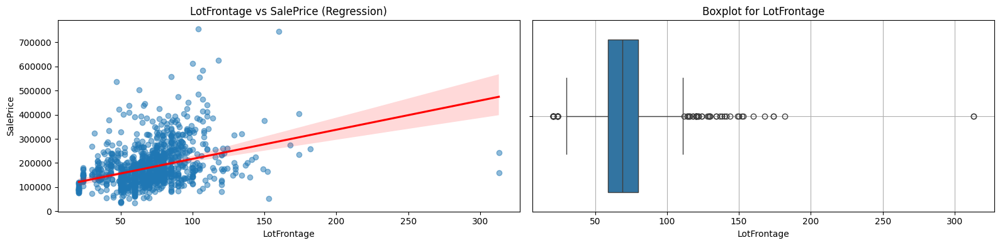

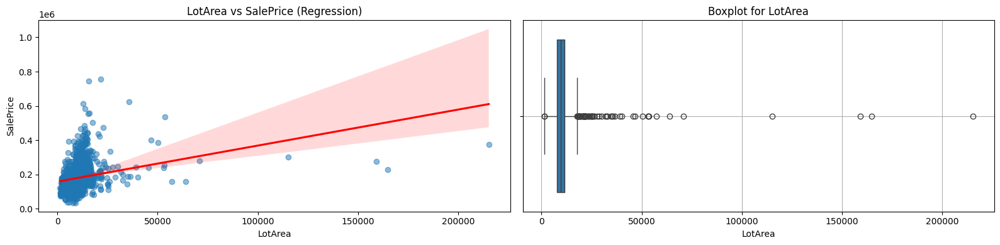

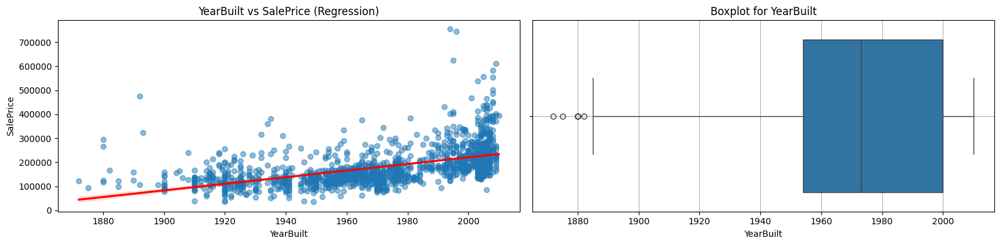

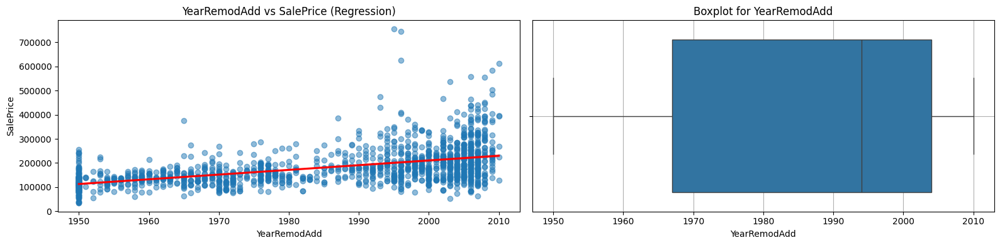

...

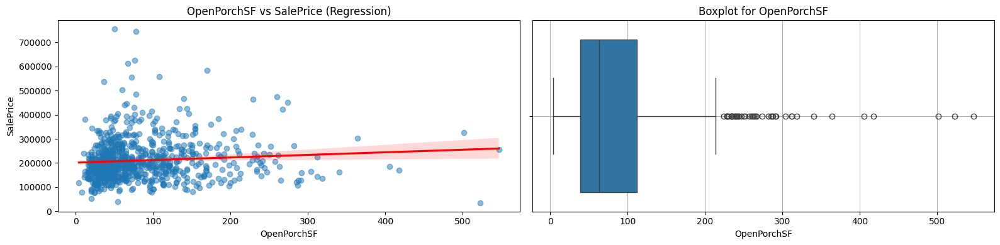

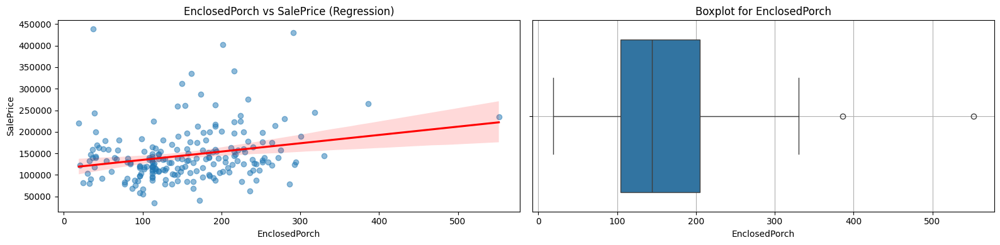

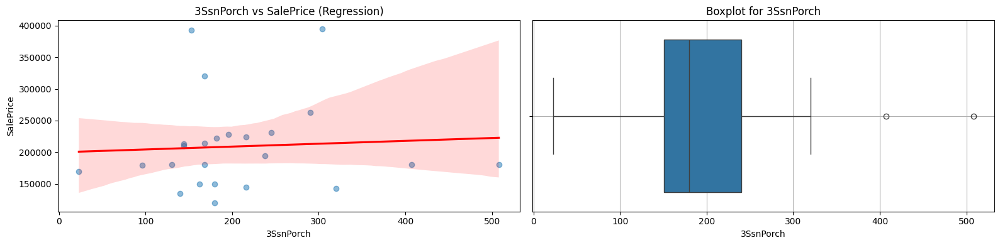

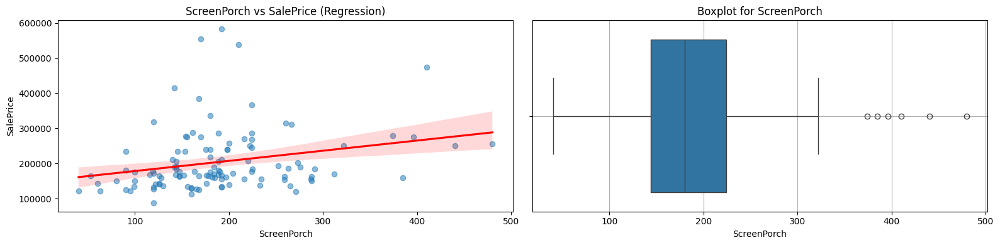

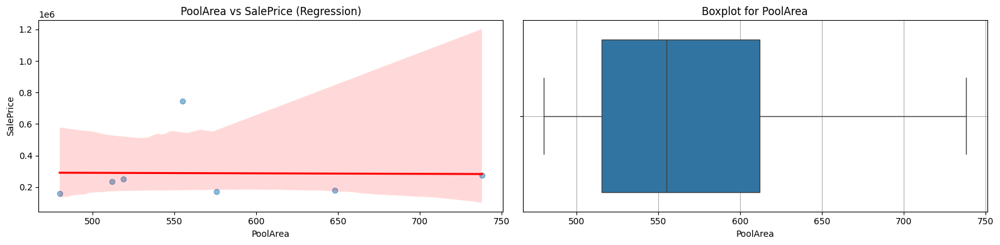

In [18]:
for col in continous_vars:
    # Filter out rows where the column is 0 or null
    filtered_df = train_df[(train_df[col] != 0) & (train_df[col].notnull()) & (train_df['SalePrice'].notnull())]

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))

    # Regression Plot
    sns.regplot(data=filtered_df,
                x=col,
                y='SalePrice',
                ax=axes[0],
                scatter_kws={'alpha': 0.5},
                line_kws={'color': 'red'})
    axes[0].set_title(f'{col} vs SalePrice (Regression)')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')

    # Boxplot
    sns.boxplot(x=filtered_df[col],
                ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


### Discrete Variables

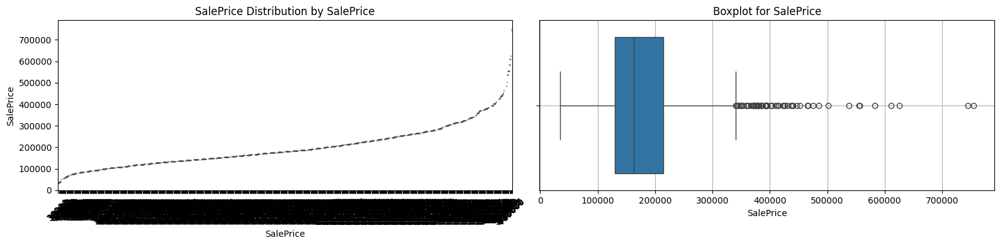

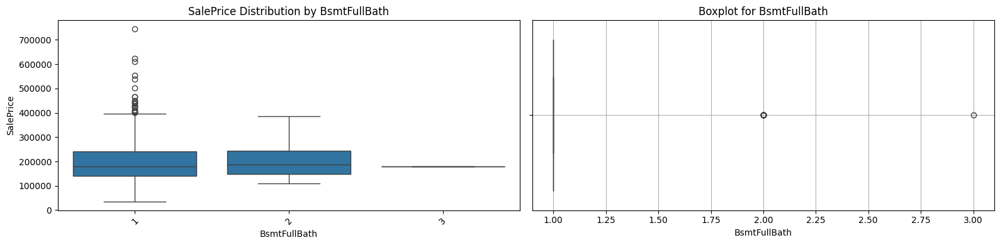

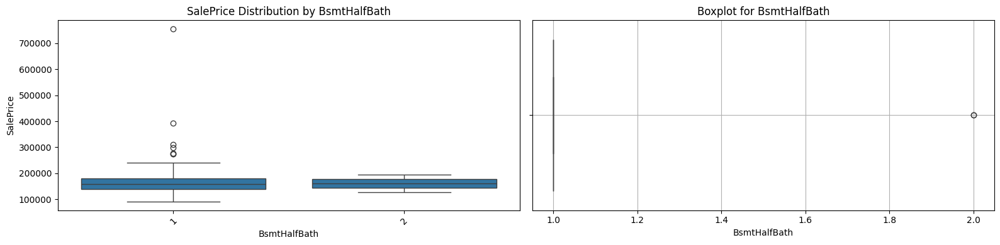

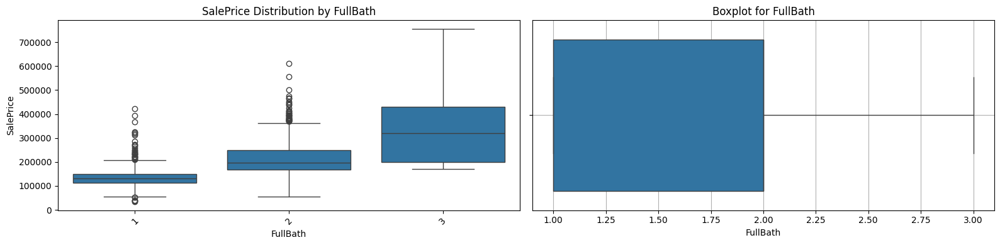

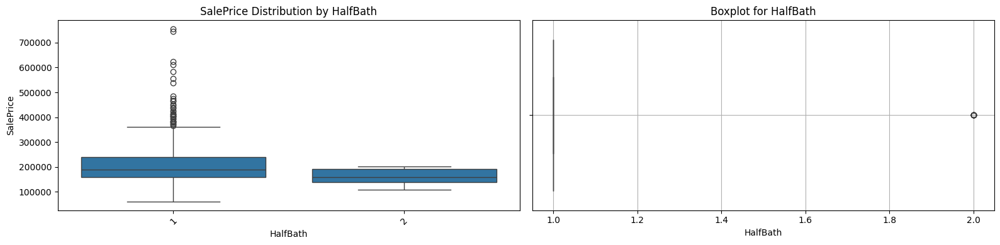

...

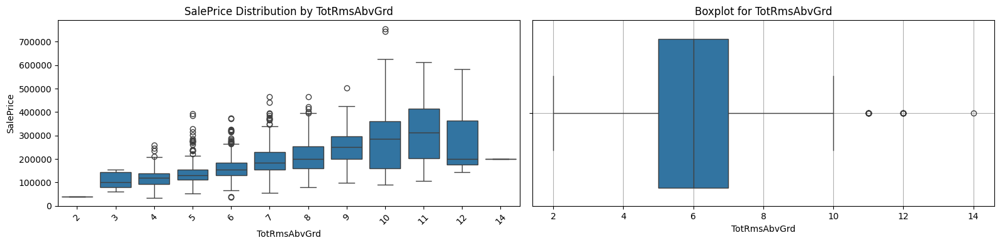

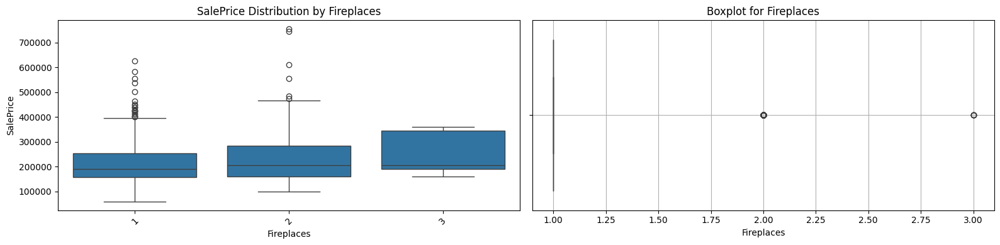

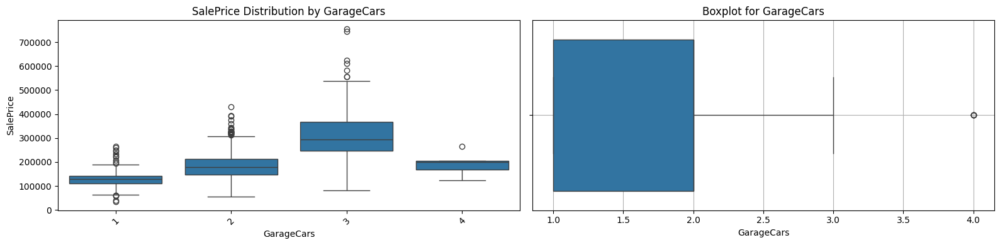

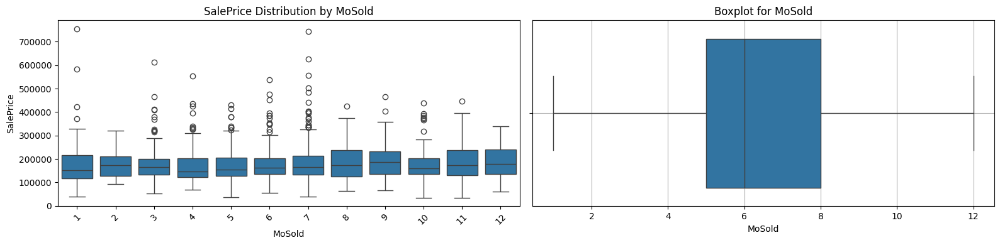

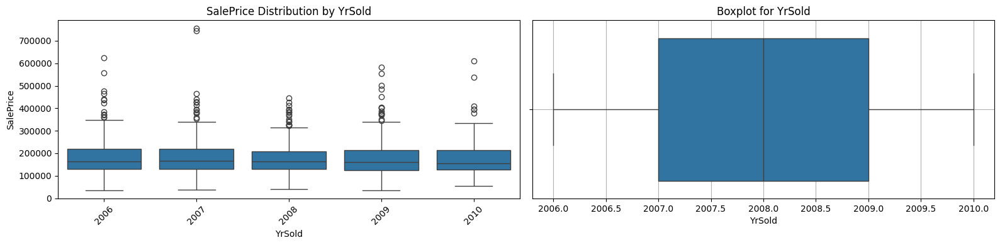

In [19]:
for col in discrete_vars:
    # Drop rows where 'col' or 'SalePrice' is NaN or where 'col' is 0
    filtered_df = train_df[
        (train_df[col].notnull()) & (train_df[col] != 0) &
        (train_df['SalePrice'].notnull())
    ]

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Boxplot of SalePrice for each category in col
    sns.boxplot(data=filtered_df, x=col, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'SalePrice Distribution by {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')
    axes[0].tick_params(axis='x', rotation=45)

    # Boxplot of the variable itself (distribution/frequency)
    sns.boxplot(x=filtered_df[col], ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


### Categorical Variables

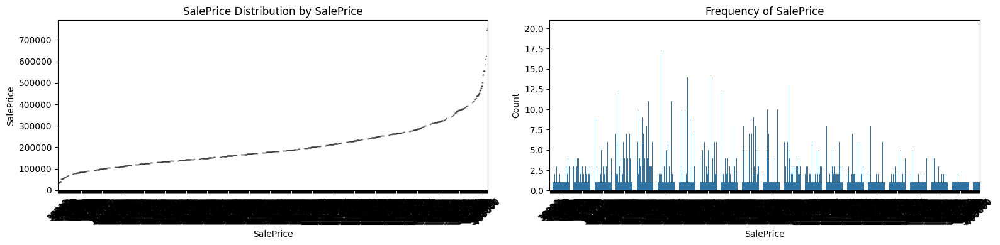

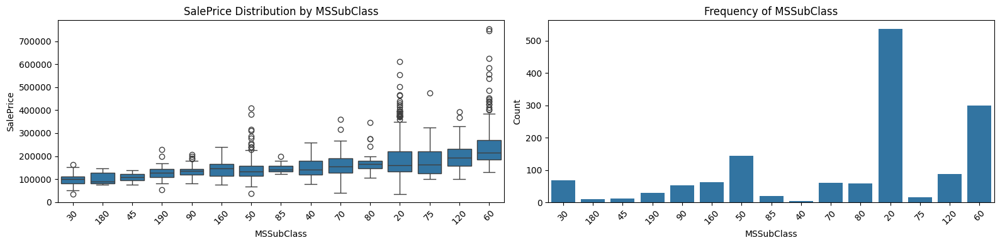

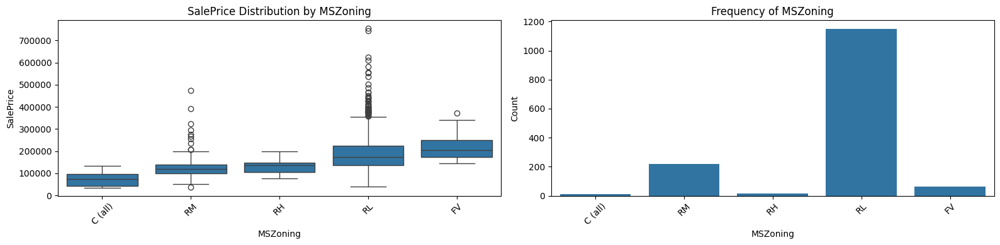

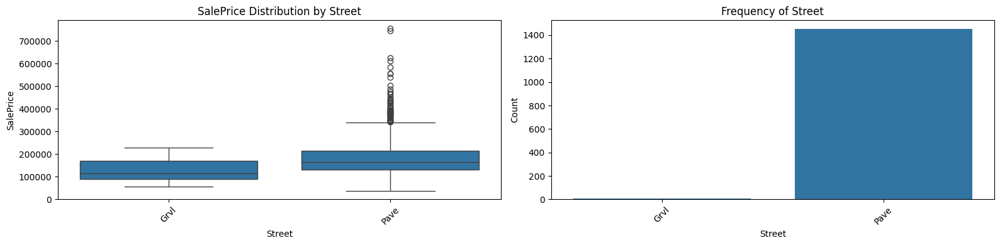

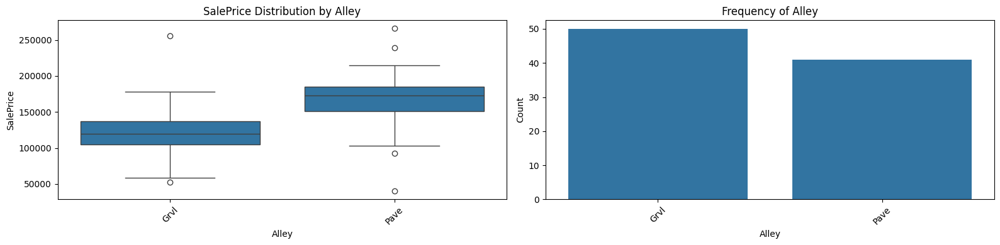

...

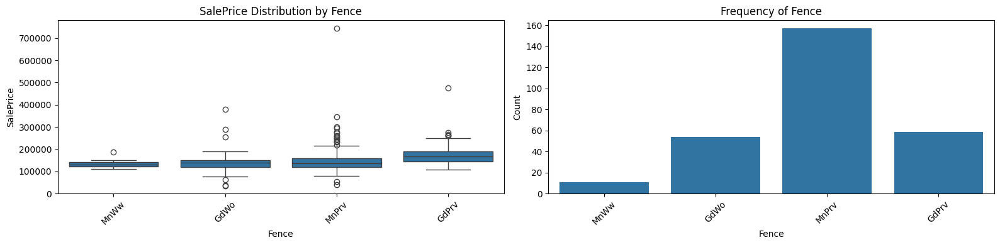

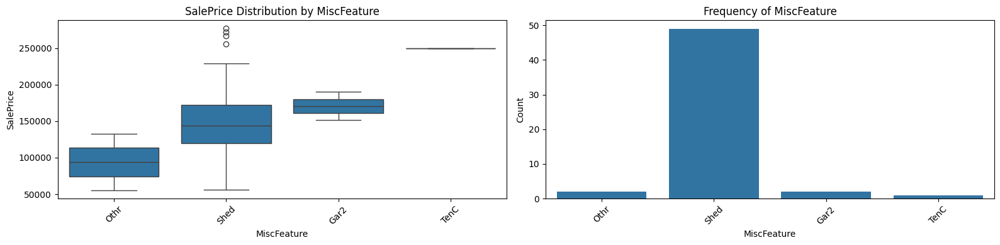

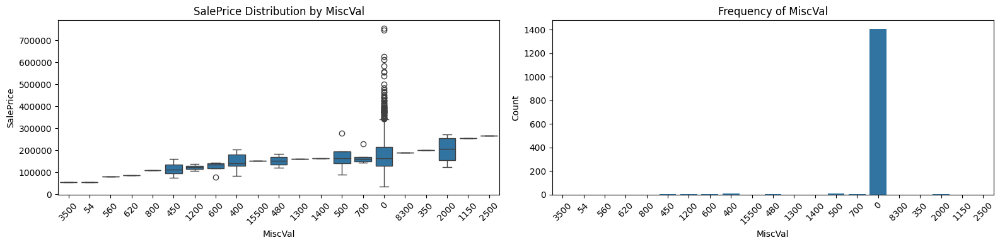

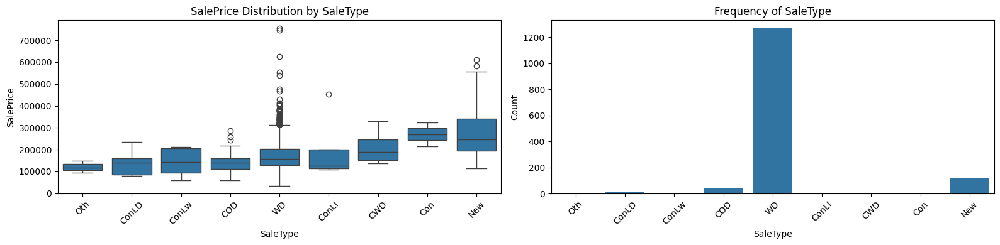

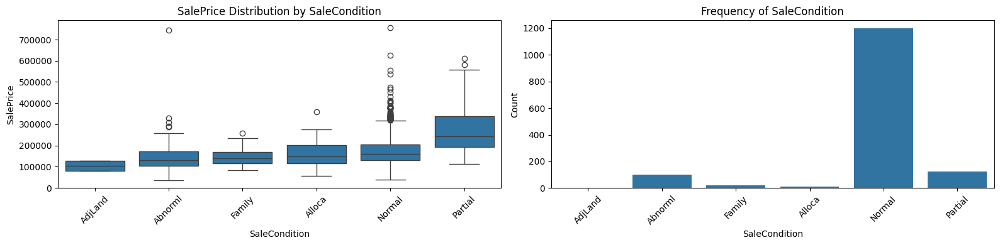

In [20]:
for col in categorical_vars:

    # Get category order based on average SalePrice (ascending)
    ordered_categories = train_df.groupby(col)['SalePrice'].mean().sort_values().index

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Left: Boxplot of SalePrice by category
    sns.boxplot(data=train_df, x=col, y='SalePrice', ax=axes[0], order=ordered_categories)
    axes[0].set_title(f'SalePrice Distribution by {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')
    axes[0].tick_params(axis='x', rotation=45)

    # Right: Frequency distribution (countplot is more intuitive than boxplot here)
    sns.countplot(data=train_df, x=col, ax=axes[1], order=ordered_categories)
    axes[1].set_title(f'Frequency of {col}')
    axes[1].set_xlabel(col)
    axes[1].set_ylabel('Count')
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()


## Regression Review

In [21]:
f_scores_list = []
p_values_list = []
valid_vars = []

X_all = train_df[continous_vars].select_dtypes(include=[float, int]).drop(columns=['SalePrice'])
y = train_df['SalePrice']

for col in X_all.columns:
    X_col = X_all[[col]].dropna()
    y_col = y.loc[X_col.index]

    if X_col[col].nunique() < 2 or y_col.nunique() < 2:
        print(f"Skipping {col} (constant or invalid values)")
        continue

    try:
        f_score, p_val = f_regression(X_col, y_col)
        f_scores_list.append(f_score[0])
        p_values_list.append(p_val[0])
        valid_vars.append(col)
    except Exception as e:
        print(f"Skipping {col} due to error: {e}")

eval_table = pd.DataFrame({
    "variable": valid_vars,
    "f_scores": f_scores_list,
    "p_values": p_values_list
}).sort_values(by="p_values", ascending=True)

display(eval_table)

,variable,f_scores,p_values
12,GrLivArea,1470.585010,4.518034e-223
14,GarageArea,926.951287,5.265038e-158
8,TotalBsmtSF,880.341282,9.484229e-152
9,1stFlrSF,845.524488,5.394711e-147
2,YearBuilt,548.665821,2.990229e-103
3,YearRemodAdd,504.714855,3.164948e-96
4,MasVnrArea,428.237393,1.458509e-83
13,GarageYrBlt,426.648985,8.705128e-83
5,BsmtFinSF1,255.923517,3.394110e-53
15,WoodDeckSF,171.494673,3.972217e-37


# Variables of Interest

In [22]:
eval_var = ["SalePrice","GrLivArea","GarageArea","1stFlrSF","YearRemodAdd"]

## Descriptive Statistics - With Selected Variables

In [23]:
train_df[eval_var]

,SalePrice,GrLivArea,GarageArea,1stFlrSF,YearRemodAdd
0,208500,1710,548,856,2003
1,181500,1262,460,1262,1976
2,223500,1786,608,920,2002
3,140000,1717,642,961,1970
4,250000,2198,836,1145,2000
...,...,...,...,...,...
1455,175000,1647,460,953,2000
1456,210000,2073,500,2073,1988
1457,266500,2340,252,1188,2006
1458,142125,1078,240,1078,1996


In [24]:
for var in eval_var:
    print(var)
    print(train_df[var].head())

SalePrice
0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64
GrLivArea
0    1710
1    1262
2    1786
3    1717
4    2198
Name: GrLivArea, dtype: int64
GarageArea
0    548
1    460
2    608
3    642
4    836
Name: GarageArea, dtype: int64
1stFlrSF
0     856
1    1262
2     920
3     961
4    1145
Name: 1stFlrSF, dtype: int64
YearRemodAdd
0    2003
1    1976
2    2002
3    1970
4    2000
Name: YearRemodAdd, dtype: int64


In [25]:
for var in eval_var:
    print(var)
    print(train_df[var].info())

SalePrice
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: SalePrice
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
GrLivArea
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: GrLivArea
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
GarageArea
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: GarageArea
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
1stFlrSF
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: 1stFlrSF
Non-Null Count  Dtype
--------------  -----
1460 non-null   int64
dtypes: int64(1)
memory usage: 11.5 KB
None
YearRemodAdd
<class 'pandas.core.series.Series'>
RangeIndex: 1460 entries, 0 to 1459
Series name: YearRemodAdd
Non-Null Count  Dtype
-------

In [26]:
for var in eval_var:
    print(var)
    print(train_df[var].describe())

SalePrice
count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64
GrLivArea
count    1460.000000
mean     1515.463699
std       525.480383
min       334.000000
25%      1129.500000
50%      1464.000000
75%      1776.750000
max      5642.000000
Name: GrLivArea, dtype: float64
GarageArea
count    1460.000000
mean      472.980137
std       213.804841
min         0.000000
25%       334.500000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64
1stFlrSF
count    1460.000000
mean     1162.626712
std       386.587738
min       334.000000
25%       882.000000
50%      1087.000000
75%      1391.250000
max      4692.000000
Name: 1stFlrSF, dtype: float64
YearRemodAdd
count    1460.000000
mean     1984.865753
std        20.645407
min      1950.000000
25%      1967.000000
50%      1994.000000
75%  

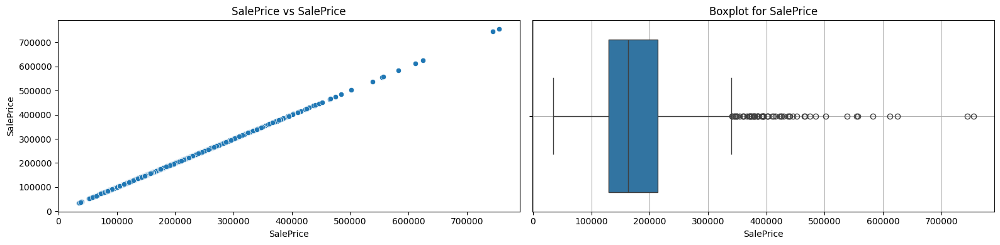

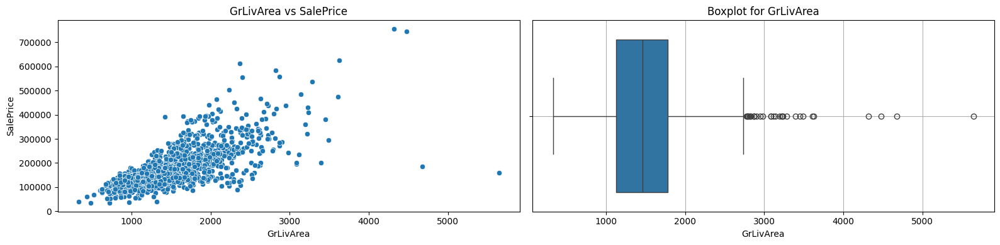

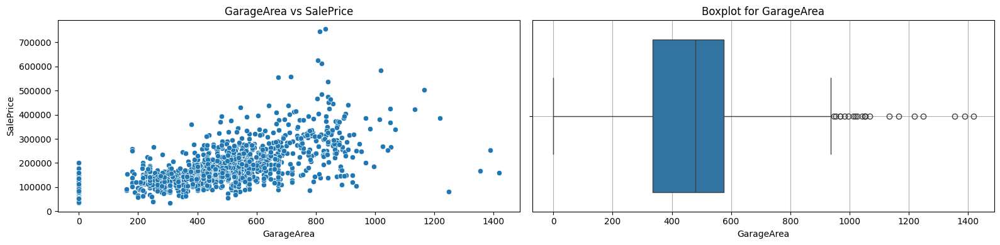

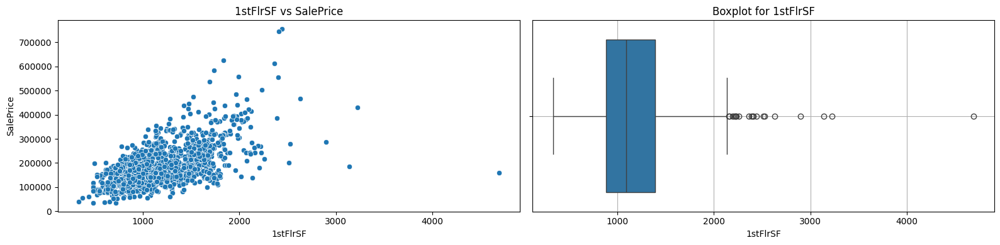

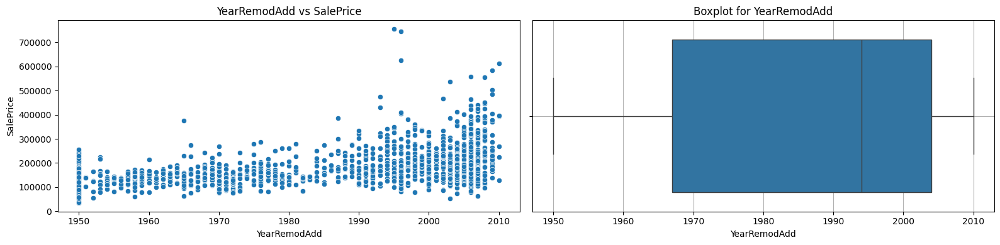

In [27]:
for var in eval_var:
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Scatterplot of var vs SalePrice
    sns.scatterplot(data=train_df, x=var, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'{var} vs SalePrice')
    axes[0].set_xlabel(var)
    axes[0].set_ylabel('SalePrice')

    # Boxplot of var
    sns.boxplot(x=train_df[var], ax=axes[1])
    axes[1].set_title(f'Boxplot for {var}')
    axes[1].set_xlabel(var)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

## Correlation Investigation

In [28]:
corr_subset = train_df[eval_var].corr()

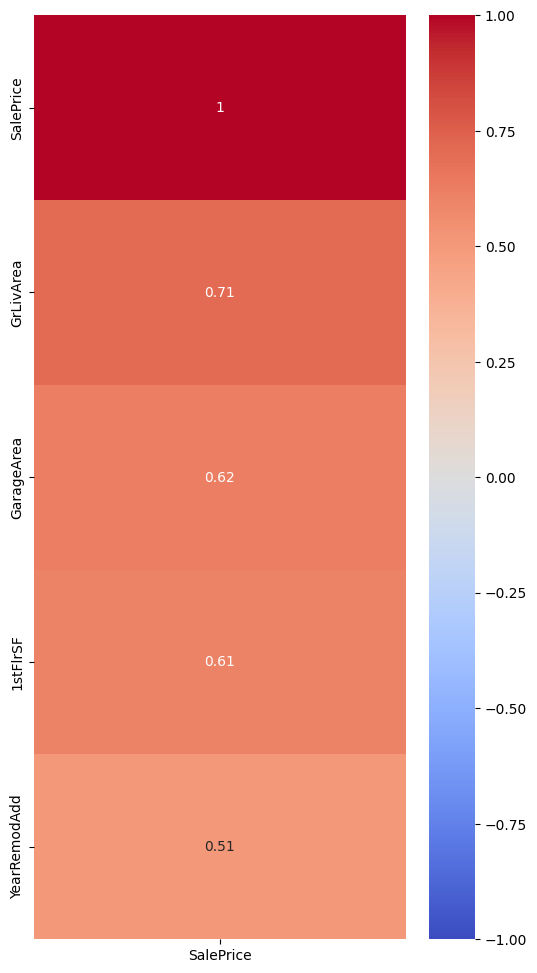

In [29]:
plt.figure(figsize=(6, 12))
sns.heatmap(corr_subset[['SalePrice']].sort_values(
                                                   by='SalePrice',
                                                   ascending=False
                                                  ),
            cmap="coolwarm",
            annot=True,
            vmin=-1,
            vmax=1
           )
plt.show()

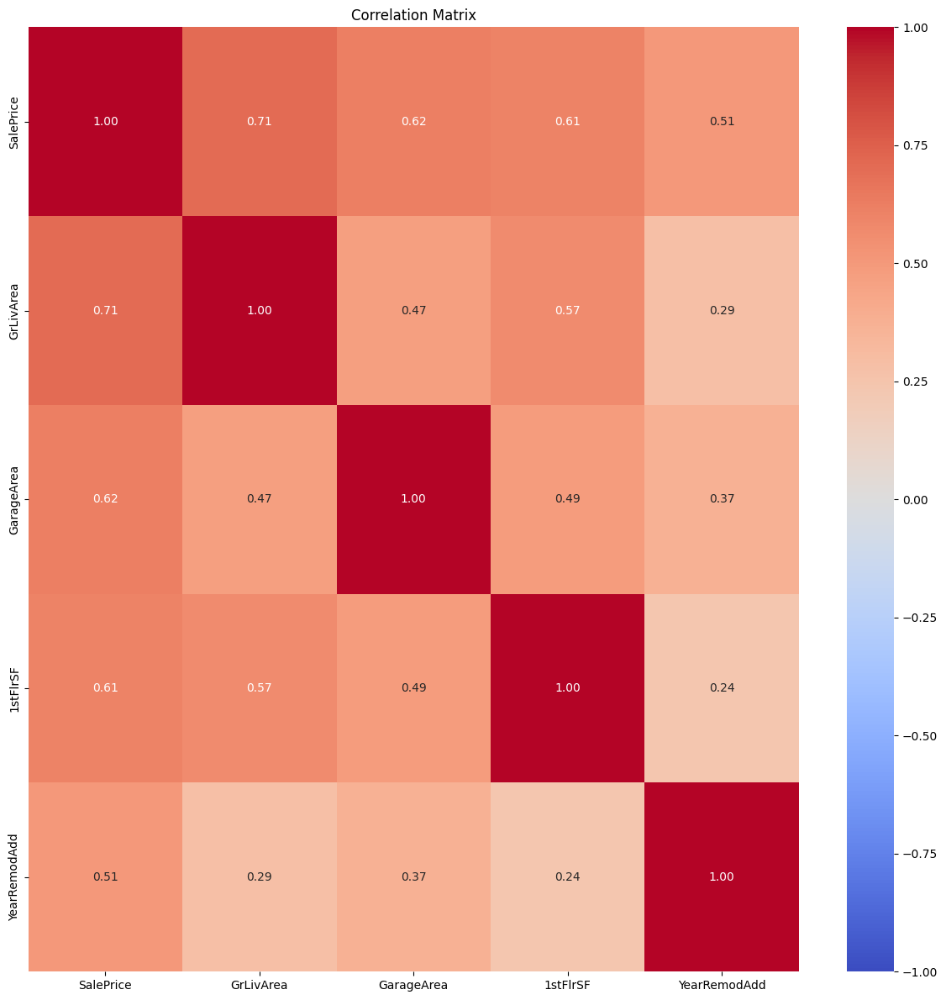

In [30]:
plt.figure(figsize=(12, 12))
sns.heatmap(corr_subset,
            annot=True,
            vmin=-1,
            vmax=1 ,
            cmap='coolwarm',
            fmt=".2f")
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

## Outlier Analysis

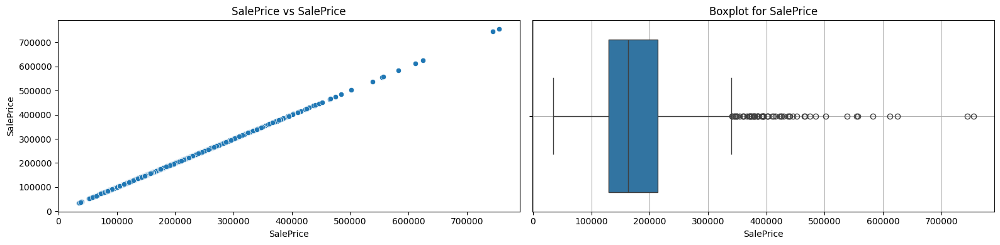

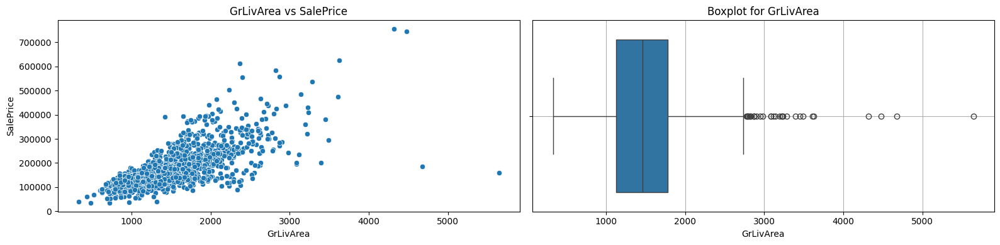

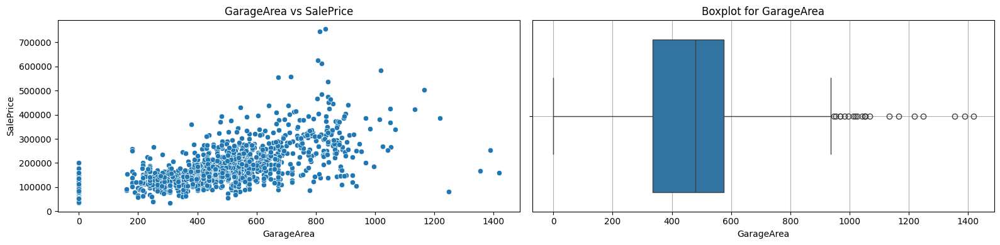

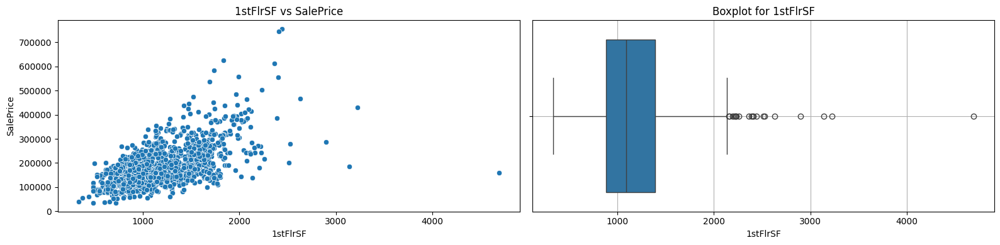

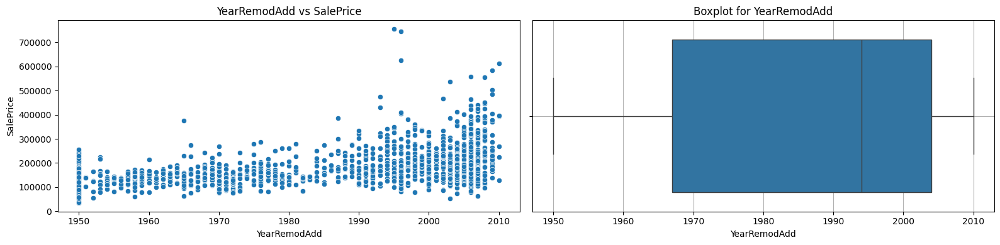

In [31]:
for col in eval_var:
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 row, 2 columns

    # Scatterplot of col vs SalePrice
    sns.scatterplot(data=train_df, x=col, y='SalePrice', ax=axes[0])
    axes[0].set_title(f'{col} vs SalePrice')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('SalePrice')

    # Boxplot of col
    sns.boxplot(x=train_df[col], ax=axes[1])
    axes[1].set_title(f'Boxplot for {col}')
    axes[1].set_xlabel(col)
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

## Regression Review

In [32]:
f_scores_list = []
p_values_list = []
valid_vars = []

X_all = train_df[eval_var].select_dtypes(include=[float, int]).drop(columns=['SalePrice'])
y = train_df['SalePrice']

for col in X_all.columns:
    X_col = X_all[[col]].dropna()
    y_col = y.loc[X_col.index]

    if X_col[col].nunique() < 2 or y_col.nunique() < 2:
        print(f"Skipping {col} (constant or invalid values)")
        continue

    try:
        f_score, p_val = f_regression(X_col, y_col)
        f_scores_list.append(f_score[0])
        p_values_list.append(p_val[0])
        valid_vars.append(col)
    except Exception as e:
        print(f"Skipping {col} due to error: {e}")

eval_table = pd.DataFrame({
    "variable": valid_vars,
    "f_scores": f_scores_list,
    "p_values": p_values_list
}).sort_values(by="p_values", ascending=True)

display(eval_table)

,variable,f_scores,p_values
0,GrLivArea,1470.585010,4.518034e-223
1,GarageArea,926.951287,5.265038e-158
2,1stFlrSF,845.524488,5.394711e-147
3,YearRemodAdd,504.714855,3.164948e-96


Using this multiple regression model, we can see that the p values for our potential predictors are very small, so we would identify these variables as potentially significant predictors. The p value provides evidence for whether the affect of potential predictors on SalesPrice could have been produced by chance, and since all p values are very small, we can conclude that these variables do affect SalesPrice in an important way.

 We will continue our analysis of these four variables. We can generate a linear regression model to determine the p-values of potential predictors and evaluate their potential for further use.

# Feature Exploration & Creation

We will create new features to improve our regression model. These features are based on simple ideas, like the age of a house and whether it has a pool. We will:  
- Make three new variables: `AgeOfHouse`, `Remodeled`, and `HasPool`  
- Check their values  
- Show their distributions in a graph  

In [33]:
df_features = train_df.copy()
df_features.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [34]:
# How old the house was when sold
df_features['AgeOfHouse'] = df_features['YrSold'] - df_features['YearBuilt']
print("Age of House (first 5 values):")
print(df_features['AgeOfHouse'].head())


Age of House (first 5 values):
0     5
1    31
2     7
3    91
4     8
Name: AgeOfHouse, dtype: int64


In [35]:
#  Remodeled or not(1 if remodeled, 0 otherwise)
df_features['Remodeled'] = (df_features['YearRemodAdd'] != df_features['YearBuilt']).astype(int)
print("Remodeled Value Counts:")
print(df_features['Remodeled'].value_counts())


Remodeled Value Counts:
Remodeled
0    764
1    696
Name: count, dtype: int64


In [36]:
# HasPool or not (1 if PoolArea > 0, else 0)
df_features['HasPool'] = df_features['PoolArea'].apply(lambda x: 1 if x > 0 else 0)

print("Has Pool Value Counts:")
print(df_features['HasPool'].value_counts())

Has Pool Value Counts:
HasPool
0    1453
1       7
Name: count, dtype: int64


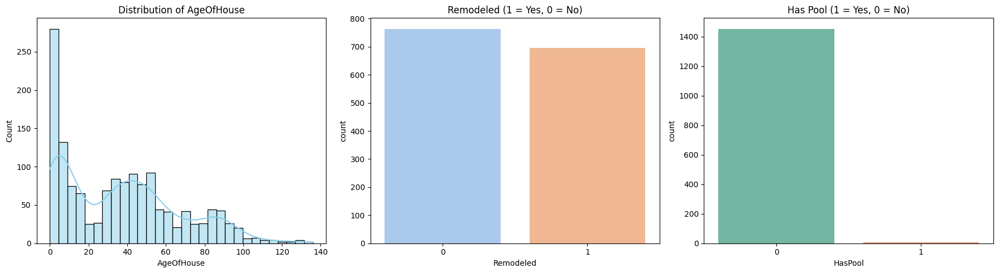

In [37]:
plt.figure(figsize=(18, 5))

# AgeOfHouse
plt.subplot(1, 3, 1)
sns.histplot(df_features['AgeOfHouse'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of AgeOfHouse')

# Remodeled
plt.subplot(1, 3, 2)
sns.countplot(x='Remodeled', hue='Remodeled', data=df_features, palette='pastel', legend=False)
plt.title('Remodeled (1 = Yes, 0 = No)')

# HasPool
plt.subplot(1, 3, 3)
sns.countplot(x='HasPool',hue='HasPool', data=df_features, palette='Set2',legend=False)
plt.title('Has Pool (1 = Yes, 0 = No)')

plt.tight_layout()
plt.show()

In [38]:
# Creating more features like 'TotalSqFeet' by adding basement, 1st and 2nd floor areas
df_features['TotalSqFeet'] = df_features['TotalBsmtSF'] + df_features['1stFlrSF'] + df_features['2ndFlrSF']

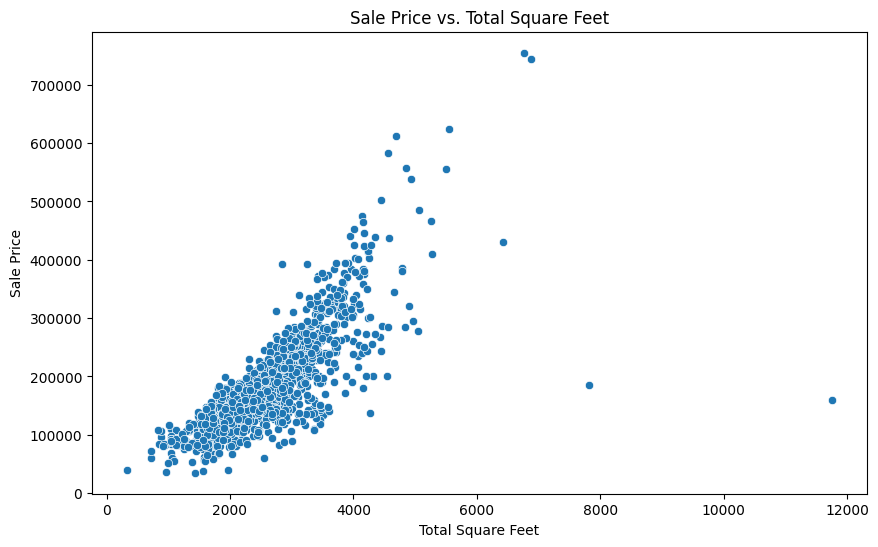

In [39]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_features['TotalSqFeet'], y=df_features['SalePrice'])
plt.title('Sale Price vs. Total Square Feet')
plt.xlabel('Total Square Feet')
plt.ylabel('Sale Price')
plt.show()

- **Age of House:** Most homes sold are relatively new, under 30 years old, with a few older properties. This shows that newer homes are more common in the market.

- **Remodeled:** There is a nearly equal number of remodeled homes (696) and homes that have not been remodeled (764). Remodeling may suggest updates or repairs that can affect how buyers see the home and its price.

- **Has Pool:** Only 7 homes have pools, making this a rare luxury feature. It serves as a simple indicator that helps identify unusual pricing.

- **Total Square Feet vs. Sale Price:** Bigger homes usually sell for higher prices, which confirms what we expect. However, there is a lot of price variation, especially among larger homes, indicating that other factors like location, condition, or features also play a role in pricing.

# Scaling: MinMax

In [40]:
# Numeric columns
columns = ['SalePrice','AgeOfHouse', 'TotalSqFeet', 'GarageArea', 'YearRemodAdd',
           'OverallQual', 'OverallCond',
           'LotArea',
           'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
           '1stFlrSF', '2ndFlrSF',
           'GrLivArea',
           'BsmtFullBath', 'BsmtHalfBath',
           'FullBath', 'HalfBath',
           'BedroomAbvGr', 'TotRmsAbvGrd',
           'Fireplaces', 'MasVnrArea',
           'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch',
           'GarageYrBlt', 'GarageCars', 'GarageArea'
]
# Initialize MinMaxScaler
minmax_scalar = MinMaxScaler()

# Fit and transform the data
df_scaled_minmax = pd.DataFrame(minmax_scalar.fit_transform(df_features[columns]), columns=columns)
print("Min-Max Scaled Data:")
df_scaled_minmax.head()

Min-Max Scaled Data:


,SalePrice,AgeOfHouse,TotalSqFeet,GarageArea,YearRemodAdd,OverallQual,OverallCond,LotArea,BsmtFinSF1,BsmtFinSF2,...,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,MasVnrArea,WoodDeckSF,OpenPorchSF,ScreenPorch,GarageYrBlt,GarageCars,GarageArea
0,0.241078,0.036765,0.195481,0.386460,0.883333,0.666667,0.500,0.033420,0.125089,0.0,...,0.375,0.500000,0.000000,0.12250,0.000000,0.111517,0.0,0.936364,0.50,0.386460
1,0.203583,0.227941,0.191802,0.324401,0.433333,0.555556,0.875,0.038795,0.173281,0.0,...,0.375,0.333333,0.333333,0.00000,0.347725,0.000000,0.0,0.690909,0.50,0.324401
2,0.261908,0.051471,0.207742,0.428773,0.866667,0.666667,0.500,0.046507,0.086109,0.0,...,0.375,0.333333,0.333333,0.10125,0.000000,0.076782,0.0,0.918182,0.50,0.428773
3,0.145952,0.669118,0.187336,0.452750,0.333333,0.666667,0.500,0.038561,0.038271,0.0,...,0.375,0.416667,0.333333,0.00000,0.000000,0.063985,0.0,0.890909,0.75,0.452750
4,0.298709,0.058824,0.263531,0.589563,0.833333,0.777778,0.500,0.060576,0.116052,0.0,...,0.500,0.583333,0.333333,0.21875,0.224037,0.153565,0.0,0.909091,0.75,0.589563


In [41]:
# get range over all values
print("Overall Max:", df_scaled_minmax.max().max())
print("Overall Min:", df_scaled_minmax.min().min())

Overall Max: 1.0
Overall Min: 0.0


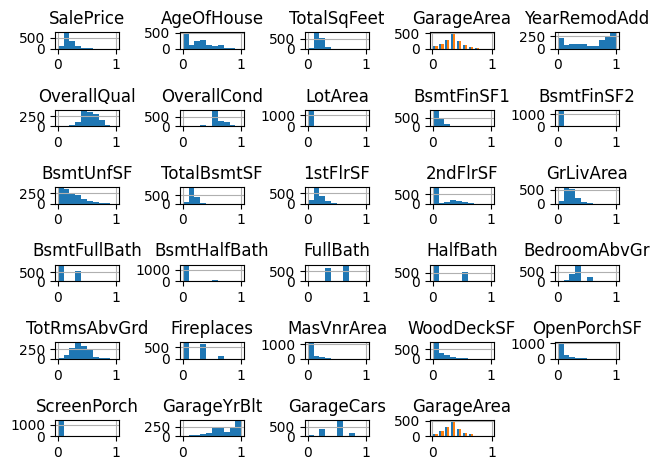

In [42]:
df_scaled_minmax.hist()
plt.tight_layout()
plt.show()

# Scaling: Standardization

In [43]:
# Initialize StandardScaler
standard_scaler = StandardScaler()

# Fit and transform the data
df_scaled_standard = pd.DataFrame(standard_scaler.fit_transform(df_features[columns]), columns=columns)
print("Standard Scaled Data:")
df_scaled_standard.head()

Standard Scaled Data:


,SalePrice,AgeOfHouse,TotalSqFeet,GarageArea,YearRemodAdd,OverallQual,OverallCond,LotArea,BsmtFinSF1,BsmtFinSF2,...,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,MasVnrArea,WoodDeckSF,OpenPorchSF,ScreenPorch,GarageYrBlt,GarageCars,GarageArea
0,0.347273,-1.043259,-0.001277,0.351000,0.878668,0.651479,-0.517200,-0.207142,0.575425,-0.288653,...,0.163779,0.912210,-0.951226,0.510015,-0.752176,0.216503,-0.270208,0.992426,0.311725,0.351000
1,0.007288,-0.183465,-0.052407,-0.060731,-0.429577,-0.071836,2.179628,-0.091886,1.171992,-0.288653,...,0.163779,-0.318683,0.600495,-0.572835,1.626195,-0.704483,-0.270208,-0.101543,0.311725,-0.060731
2,0.536154,-0.977121,0.169157,0.631726,0.830215,0.651479,-0.517200,0.073480,0.092907,-0.288653,...,0.163779,-0.318683,0.600495,0.322174,-0.752176,-0.070361,-0.270208,0.911391,0.311725,0.631726
3,-0.515281,1.800676,-0.114493,0.790804,-0.720298,0.651479,-0.517200,-0.096897,-0.499274,-0.288653,...,0.163779,0.296763,0.600495,-0.572835,-0.752176,-0.176048,-0.270208,0.789839,1.650307,0.790804
4,0.869843,-0.944052,0.944631,1.698485,0.733308,1.374795,-0.517200,0.375148,0.463568,-0.288653,...,1.390023,1.527656,0.600495,1.360826,0.780197,0.563760,-0.270208,0.870874,1.650307,1.698485


In [44]:
# get range over all values
print("Overall Max:", df_scaled_standard.max().max())
print("Overall Min:", df_scaled_standard.min().min())

Overall Max: 20.51827315777325
Overall Min: -4.112969893342749


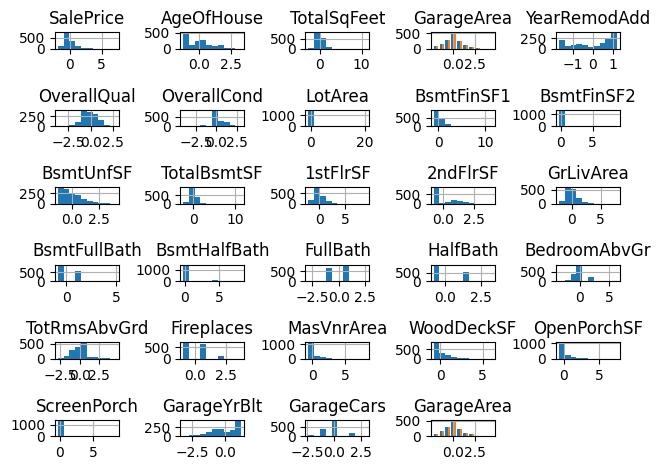

In [45]:
df_scaled_standard.hist()
plt.tight_layout()
plt.show()

# Regression Modelling

In [46]:
# function to print VIF and return summary data
def ols_function_modeling(y, X, X_const):
  # output VIF values
  vif_data = pd.DataFrame()
  vif_data["Feature"] = X_const.columns
  vif_data["VIF"] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
  print(vif_data)
  print()

  # fit model and output summary
  model = sm.OLS(y, X).fit()
  return model

In [47]:
# A function to train an OLS model and return predictions on test data
def return_predictions(X_train, X_test, y_train, y_test):
    # Add intercept term manually (required for statsmodels OLS)
    X_train = sm.add_constant(X_train, has_constant='add')
    X_test = sm.add_constant(X_test, has_constant='add')

    # Fit model and predict
    ols_model = sm.OLS(y_train, X_train).fit()
    preds = ols_model.predict(X_test)

    return preds, ols_model

# Cross-validation loop to get predicted and actual values across all folds
def cross_validation_predictions(X, y):
    prediction_list = []
    y_true_list = []
    model_list = []

    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    for train_idx, test_idx in kf.split(X):
        # Support both NumPy arrays and pandas DataFrames
        X_train = X.iloc[train_idx] if hasattr(X, 'iloc') else X[train_idx]
        X_test = X.iloc[test_idx] if hasattr(X, 'iloc') else X[test_idx]
        y_train = y[train_idx]
        y_test = y[test_idx]

        preds, model = return_predictions(X_train, X_test, y_train, y_test)
        prediction_list.append(preds)
        y_true_list.append(y_test)
        model_list.append(model)

    return prediction_list, y_true_list, model_list

# Calculates and stores regression performance metrics
def return_cross_validation_metrics(prediction_list, y_test_list, model_list):
    metrics = {
        'r2': [],
        'mse': [],
        'rmse': [],
        'mae': [],
        'y_true': [],
        'y_pred': [],
        'residuals': [],
        'adj_r2': [],
        'aic': [],
    }

    # Model-specific metrics across folds
    for i, model in enumerate(model_list):
        preds = prediction_list[i]
        y_test = y_test_list[i]

        metrics['adj_r2'].append(model.rsquared_adj)
        metrics['aic'].append(model.aic)
        metrics['r2'].append(r2_score(y_test, preds))
        metrics['mse'].append(mean_squared_error(y_test, preds))
        metrics['rmse'].append(np.sqrt(mean_squared_error(y_test, preds)))
        metrics['mae'].append(mean_absolute_error(y_test, preds))
        metrics['y_true'].extend(y_test)
        metrics['y_pred'].extend(preds)
        metrics['residuals'].extend(y_test - preds)

    return metrics

# Print all metrics from the report
def print_cross_validation_metrics(metrics):
    print("Cross-Validated Goodness-of-Fit Summary:\n" + "-" * 50)
    for name, vals in metrics.items():
        if isinstance(vals, list) and all(isinstance(v, (int, float, np.floating)) for v in vals):
            print(f"{name:10}: {np.mean(vals):.4f}")

## Model 1
Regression modeling over a subset of chosen features, no scaling

In [48]:
X1 = df_features[['AgeOfHouse', 'TotalSqFeet', 'GarageArea', 'YearRemodAdd']]
y1 = df_features['SalePrice']
X1_const = add_constant(X1)

In [49]:
# pass to function for modeling
model_1 = ols_function_modeling(y1, X1, X1_const)
print(model_1.summary())

        Feature           VIF
0         const  14761.478637
1    AgeOfHouse      1.746000
2   TotalSqFeet      1.512370
3    GarageArea      1.695558
4  YearRemodAdd      1.590378

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.952
Model:                            OLS   Adj. R-squared (uncentered):              0.952
Method:                 Least Squares   F-statistic:                              7191.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):                        0.00
Time:                        15:00:09   Log-Likelihood:                         -17661.
No. Observations:                1460   AIC:                                  3.533e+04
Df Residuals:                    1456   BIC:                                  3.535e+04
Df Model:                           4                                                  
Covariance Type:           

In [50]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X1, y1)
model_1_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_1_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6020
mse       : 1939047817.1710
rmse      : 42883.3868
mae       : 26251.7718
y_true    : 181020.7499
y_pred    : 180921.1959
residuals : 99.5541
adj_r2    : 0.7180
aic       : 28185.8739


In [51]:
# model1 = sm.OLS(y1, X1).fit()

In [52]:
# vif_data1 = pd.DataFrame()
# vif_data1["Feature"] = X1_const.columns
# vif_data1["VIF"] = [variance_inflation_factor(X1_const.values, i) for i in range(X1_const.shape[1])]

In [53]:
# print(vif_data1)

In [54]:
# print(model1.summary())

## Model 2
Regression modeling over a separate subset of chosen features, no scaling

In [55]:
X2 = df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']]
y2 = df_features['SalePrice']
X2_const = add_constant(X2)

In [56]:
# pass to function for modeling
model_2 = ols_function_modeling(y2, X2, X2_const)
print(model_2.summary())

        Feature           VIF
0         const  13619.776384
1   TotalBsmtSF      1.558372
2     GrLivArea      2.114247
3      FullBath      1.932370
4    GarageArea      1.634378
5   OverallQual      2.462756
6  YearRemodAdd      1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.961
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              5896.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):                        0.00
Time:                        15:00:09   Log-Likelihood:                         -17515.
No. Observations:                1460   AIC:                                  3.504e+04
Df Residuals:                    1454   BIC:                                  3.507e+04
Df Model:                           6                  

In [57]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X2, y2)
model_2_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_2_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6844
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180977.2067
y_pred    : 180921.1959
residuals : 56.0108
adj_r2    : 0.7661
aic       : 27971.0865


In [58]:
# model2 = sm.OLS(y2, X2).fit()

In [59]:
# vif_data2 = pd.DataFrame()
# vif_data2["Feature"] = X2_const.columns
# vif_data2["VIF"] = [variance_inflation_factor(X2_const.values, i) for i in range(X2_const.shape[1])]

In [60]:
# print(vif_data2)

In [61]:
# print(model2.summary())

## Model 3
Regression modeling over a subset of chosen features, standard scaling.
Use variables from Model 2 to attempt to address multicollinearity

In [62]:
x_scaler = StandardScaler()
y_scaler = StandardScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X3 = pd.DataFrame(x_scaler.fit_transform(df_features[columns]), columns=columns)
y3 = pd.DataFrame(y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X3_const = add_constant(X3)

In [63]:
# pass to function for modeling
model_3 = ols_function_modeling(y3, X3, X3_const)
print(model_3.summary())

        Feature       VIF
0         const  1.000000
1   TotalBsmtSF  1.558372
2     GrLivArea  2.114247
3      FullBath  1.932370
4    GarageArea  1.634378
5   OverallQual  2.462756
6  YearRemodAdd  1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.765
Model:                            OLS   Adj. R-squared (uncentered):              0.764
Method:                 Least Squares   F-statistic:                              790.6
Date:                Thu, 10 Jul 2025   Prob (F-statistic):                        0.00
Time:                        15:00:09   Log-Likelihood:                         -1013.3
No. Observations:                1460   AIC:                                      2039.
Df Residuals:                    1454   BIC:                                      2070.
Df Model:                           6                                                  

In [64]:
# cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X3, y3)

# need to inverse scale predictions and y_test
predictions = [y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


# obtain metrics
model_3_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_3_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6844
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180977.2067
y_pred    : 180921.1959
residuals : 56.0108
adj_r2    : 0.7661
aic       : 1615.2921


## Model 4
Regression modeling over a subset of chosen features, MinMax scaling, again to see improvement over metrics while mitigating multicollinearity


In [65]:
min_max_x_scaler = MinMaxScaler()
min_max_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X4 = pd.DataFrame(min_max_x_scaler.fit_transform(df_features[columns]), columns=columns)
y4 = pd.DataFrame(min_max_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X4_const = add_constant(X4)

In [66]:
# pass to function for modeling
model_4 = ols_function_modeling(y4, X4, X4_const)
print(model_4.summary())

        Feature        VIF
0         const  16.521068
1   TotalBsmtSF   1.558372
2     GrLivArea   2.114247
3      FullBath   1.932370
4    GarageArea   1.634378
5   OverallQual   2.462756
6  YearRemodAdd   1.548478

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.928
Model:                            OLS   Adj. R-squared (uncentered):              0.928
Method:                 Least Squares   F-statistic:                              3133.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):                        0.00
Time:                        15:00:09   Log-Likelihood:                          1991.5
No. Observations:                1460   AIC:                                     -3971.
Df Residuals:                    1454   BIC:                                     -3939.
Df Model:                           6                                          

In [67]:
# cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X4, y4)

# need to inverse scale predictions and y_test
predictions = [min_max_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [min_max_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


# obtain metrics
model_4_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_4_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6844
mse       : 1623559188.5505
rmse      : 39355.4940
mae       : 24438.2108
y_true    : 180977.2067
y_pred    : 180921.1959
residuals : 56.0108
adj_r2    : 0.7661
aic       : -3534.8851


In [68]:
# vif_data2 = pd.DataFrame()
# vif_data2["Feature"] = X2_const.columns
# vif_data2["VIF"] = [variance_inflation_factor(X2_const.values, i) for i in range(X2_const.shape[1])]

## Model 5
Linear regression utilizing Foward feature selection, another way to perform regression while potentially mitigating multicollinarity

In [69]:
# confirming feature selection of numericfal with forward selection
y = df_features.SalePrice
X= df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd','AgeOfHouse', 'TotalSqFeet']]

linearreg = LinearRegression()
forwad = SequentialFeatureSelector(
linearreg,
k_features=4,
forward=True,
verbose=1,
scoring="neg_mean_squared_error"
)
sf = forwad.fit(X,y)

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished
Features: 1/4[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished
Features: 2/4[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.1s finished
Features: 3/4[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished
Features: 4/4

In [70]:
# outputting the selected best 4 features
feat_names = list(sf.k_feature_names_)
print(feat_names)

print(sf.k_feature_idx_)

['GarageArea', 'OverallQual', 'YearRemodAdd', 'TotalSqFeet']
(3, 4, 5, 7)


In [71]:
# model with selected features
X5 = df_features[feat_names]
y5 = df_features['SalePrice']
X5_const = add_constant(X5)

In [72]:
# pass to function for modeling
model_5 = ols_function_modeling(y5, X5, X5_const)
print(model_5.summary())

        Feature           VIF
0         const  12814.298095
1    GarageArea      1.631435
2   OverallQual      2.415773
3  YearRemodAdd      1.454402
4   TotalSqFeet      2.003170

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.960
Model:                            OLS   Adj. R-squared (uncentered):              0.960
Method:                 Least Squares   F-statistic:                              8787.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):                        0.00
Time:                        15:00:10   Log-Likelihood:                         -17521.
No. Observations:                1460   AIC:                                  3.505e+04
Df Residuals:                    1456   BIC:                                  3.507e+04
Df Model:                           4                                                  
Covariance Type:           

In [73]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(X5, y5)
model_5_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_5_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6825
mse       : 1632503182.3843
rmse      : 39443.2008
mae       : 24370.6726
y_true    : 180988.3851
y_pred    : 180921.1959
residuals : 67.1892
adj_r2    : 0.7645
aic       : 27976.9082


## Model 6
Polynomial Regression over a subset of features,  employing MinMax scaling to attempt to optimize on Model 3


In [74]:
mod_6_x_scaler = MinMaxScaler()
mod_6_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X6 = pd.DataFrame(mod_6_x_scaler.fit_transform(df_features[columns]), columns=columns)
y6 = pd.DataFrame(mod_6_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]
X6_const = add_constant(X6)

In [75]:
polynomial_features= PolynomialFeatures(degree=3)
xp = polynomial_features.fit_transform(X6)
xp.shape

(1460, 84)

In [76]:
# pass to function for modeling
model_6 = ols_function_modeling(y6, xp, X6_const)
print(model_6.summary())

        Feature        VIF
0         const  16.521068
1   TotalBsmtSF   1.558372
2     GrLivArea   2.114247
3      FullBath   1.932370
4    GarageArea   1.634378
5   OverallQual   2.462756
6  YearRemodAdd   1.548478

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     120.3
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        15:00:10   Log-Likelihood:                 2688.3
No. Observations:                1460   AIC:                            -5209.
Df Residuals:                    1376   BIC:                            -4765.
Df Model:                          83                                         
Covariance Type:            nonrobust                                   

In [77]:
# # cross validation to obtain metrics needed for later evaluation
predictions, y_test, model_list = cross_validation_predictions(xp, y6)

# need to inverse scale predictions and y_test
predictions = [mod_6_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in predictions]
y_test = [mod_6_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_test]


model_6_metrics = return_cross_validation_metrics(y_test, predictions, model_list)
print_cross_validation_metrics(model_6_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7315
mse       : 1842552225.8063
rmse      : 40595.3691
mae       : 22350.9330
y_true    : 182282.0659
y_pred    : 180921.1959
residuals : 1360.8700
adj_r2    : 0.8762
aic       : -4198.6067


## Model 7
Generative Additive Model for chosen subset of features

In [78]:
mod_7_x_scaler = MinMaxScaler()
mod_7_y_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X7 = pd.DataFrame(mod_7_x_scaler.fit_transform(df_features[columns]), columns=columns)
y7 = pd.DataFrame(mod_7_y_scaler.fit_transform(df_features[['SalePrice']]), columns=["SalePrice"])["SalePrice"]

In [79]:
!pip install pygam

In [80]:
# Fit a GAM with automatic smoothing selection
# grid search implemented to choose the optimal amount of smoothing
model_7 = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5)).gridsearch(X7.values, y7)

# Print summary
model_7.summary()

100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     74.4054
Link Function:                     IdentityLink Log Likelihood:                               -440660.7952
Number of Samples:                         1460 AIC:                                           881472.4012
                                                AICc:                                          881480.7293
                                                GCV:                                                0.0017
                                                Scale:                                              0.0015
                                                Pseudo R-Squared:                                   0.8795
Feature Function                  Lam

/tmp/ipython-input-80-4212504894.py:6: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  model_7.summary()


In [81]:
# need to evaluate w cross validation differently
# applying smoothing logic to each split
kf = KFold(n_splits=5, shuffle=True, random_state=42)

prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X7):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X7.iloc[train_idx] if hasattr(X7, 'iloc') else X7[train_idx]
    X_test = X7.iloc[test_idx] if hasattr(X7, 'iloc') else X7[test_idx]
    y_train = y7[train_idx]
    y_test = y7[test_idx]

    model = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5)).gridsearch(X_train.values, y_train)
    preds = model.predict(X_test)

    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:03 Time:  0:00:03
100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02


In [82]:
# need to inverse scale predictions and y_test
prediction_list = [mod_7_y_scaler.inverse_transform(pd.DataFrame(p)).flatten() for p in prediction_list]
y_true_list = [mod_7_y_scaler.inverse_transform(pd.DataFrame(y)).flatten() for y in y_true_list]



In [83]:
# now get metrics
model_7_metrics = {
        'r2': [],
        'mse': [],
        'rmse': [],
        'mae': [],
        'y_true': [],
        'y_pred': [],
        'residuals': [],
        'adj_r2': [],
        'aic': [],
    }


# Get degrees of freedom (p) and number of observations (n)
for i, model in enumerate(model_list):
  p = model.statistics_['edof']            # effective degrees of freedom

  # get AIC
  model_7_metrics['aic'].append(model.statistics_['AIC'])

  # get remaining metrics
  preds = prediction_list[i]
  y_test = y_true_list[i]
  n = len(y_test)                        # number of observations

  # Compute Adjusted R²
  r2 = r2_score(y_test, preds)
  adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
  model_7_metrics['adj_r2'].append(adj_r2)

  model_7_metrics['r2'].append(r2)
  model_7_metrics['mse'].append(mean_squared_error(y_test, preds))
  model_7_metrics['rmse'].append(np.sqrt(mean_squared_error(y_test, preds)))
  model_7_metrics['mae'].append(mean_absolute_error(y_test, preds))
  model_7_metrics['y_true'].extend(y_test)
  model_7_metrics['y_pred'].extend(preds)
  model_7_metrics['residuals'].extend(y_test - preds)

In [84]:
print_cross_validation_metrics(model_7_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.7142
mse       : 1726624747.7922
rmse      : 40105.0712
mae       : 22862.7535
y_true    : 180921.1959
y_pred    : 182467.5475
residuals : -1546.3516
adj_r2    : 0.6463
aic       : 713062.5515


# Goodness of Fit and Model Evaluation

## Residual Analysis

In [85]:
# list of our metrics results
all_metrics_dict = {
    'Model 1': model_1_metrics,
    'Model 2': model_2_metrics,
    'Model 3': model_3_metrics,
    'Model 4': model_4_metrics,
    'Model 5': model_5_metrics,
    'Model 6': model_6_metrics,
    'Model 7': model_7_metrics
}

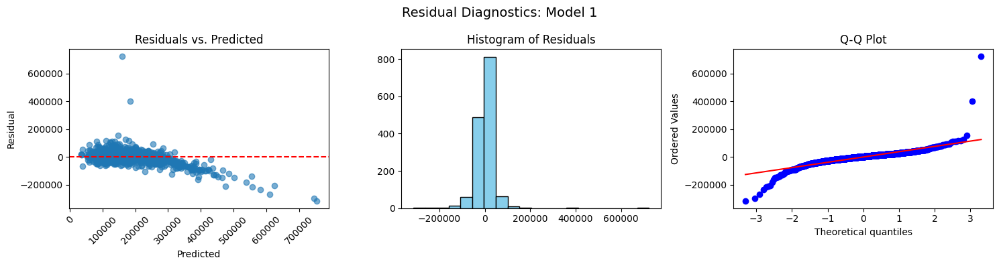

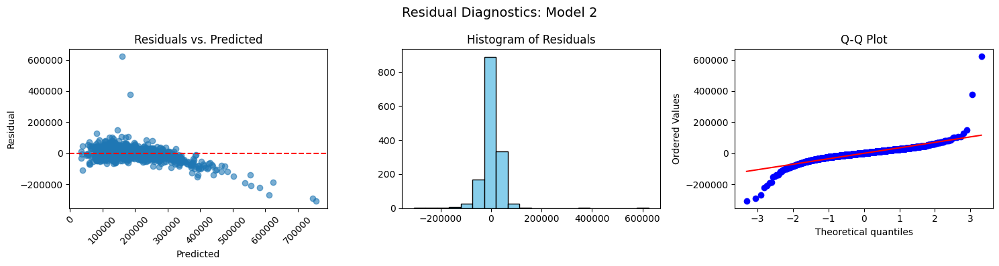

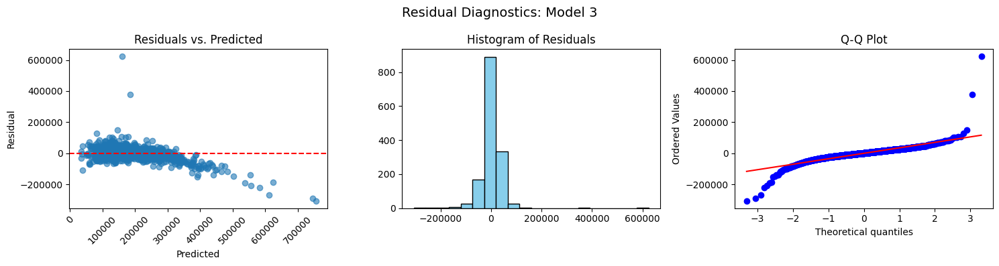

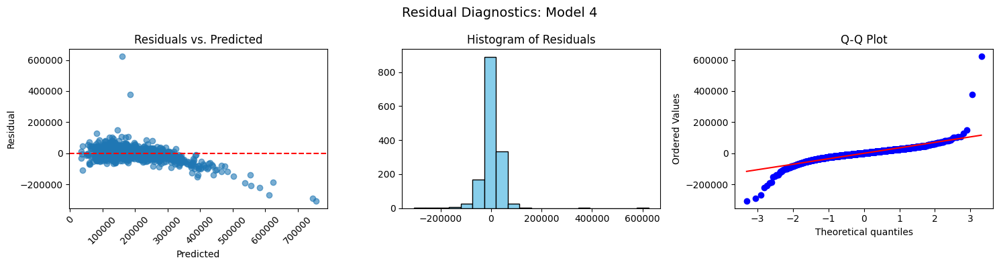

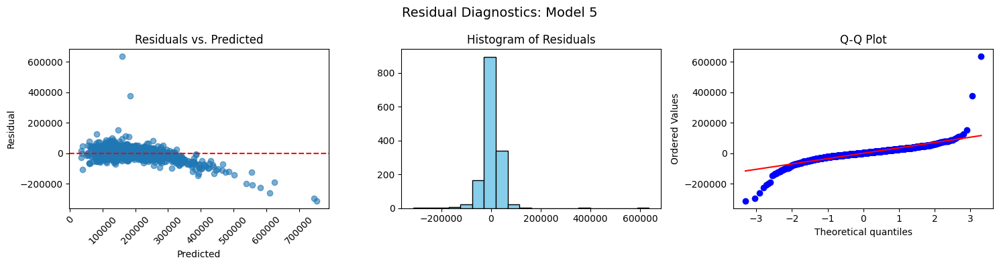

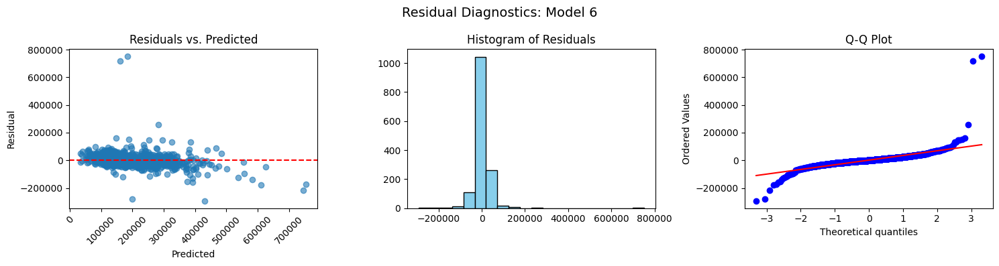

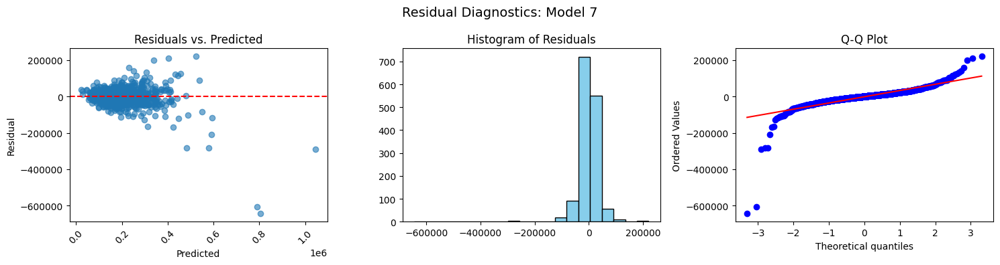

In [86]:
# plotting residual analysis


for model, metrics in all_metrics_dict.items():
      y_true = np.array(metrics['y_true'])
      y_pred = np.array(metrics['y_pred'])
      residuals = np.array(metrics['residuals'])

      fig, axs = plt.subplots(1, 3, figsize=(15, 4))
      fig.suptitle(f'Residual Diagnostics: {model}', fontsize=14)

      # Residuals vs Predictions
      axs[0].scatter(y_pred, residuals, alpha=0.6)
      axs[0].axhline(0, color='red', linestyle='--')
      axs[0].set_title('Residuals vs. Predicted')
      axs[0].set_xlabel('Predicted')
      axs[0].set_ylabel('Residual')
      # adjust axis rotate
      axs[0].tick_params(axis='x', labelrotation = 45)

      # Histogram
      axs[1].hist(residuals, bins=20, color='skyblue', edgecolor='black')
      axs[1].set_title('Histogram of Residuals')

      # Q-Q plot
      stats.probplot(residuals, dist="norm", plot=axs[2])
      axs[2].set_title('Q-Q Plot')

      plt.tight_layout()
      plt.show()

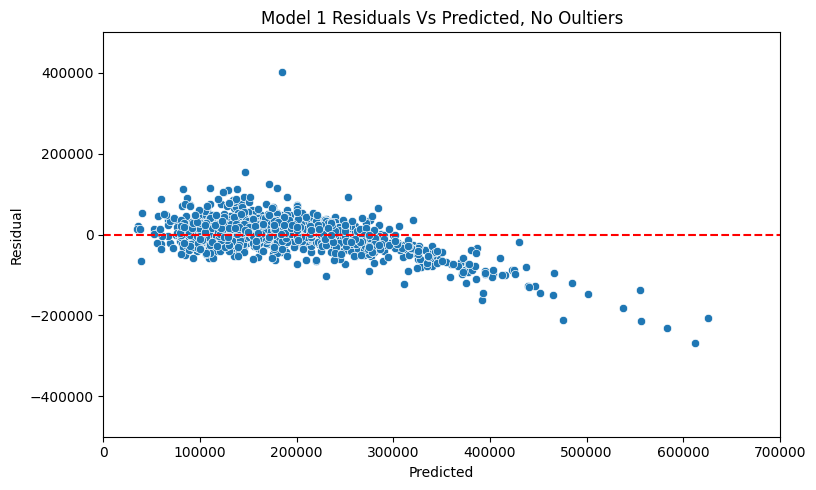

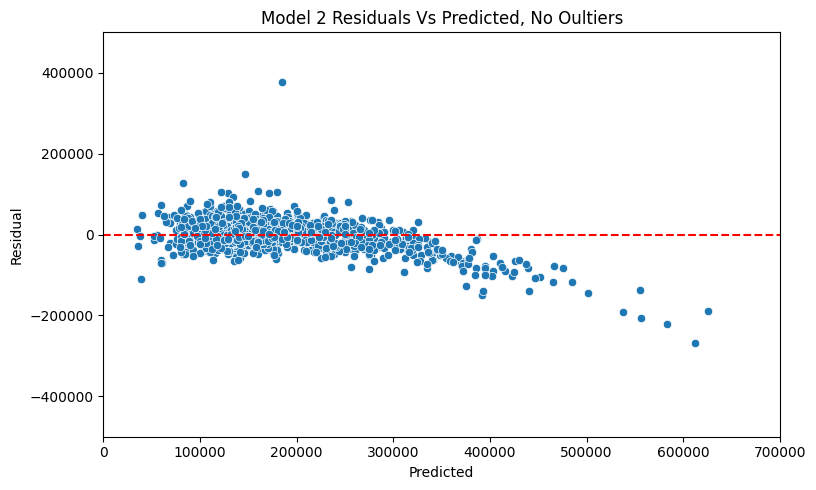

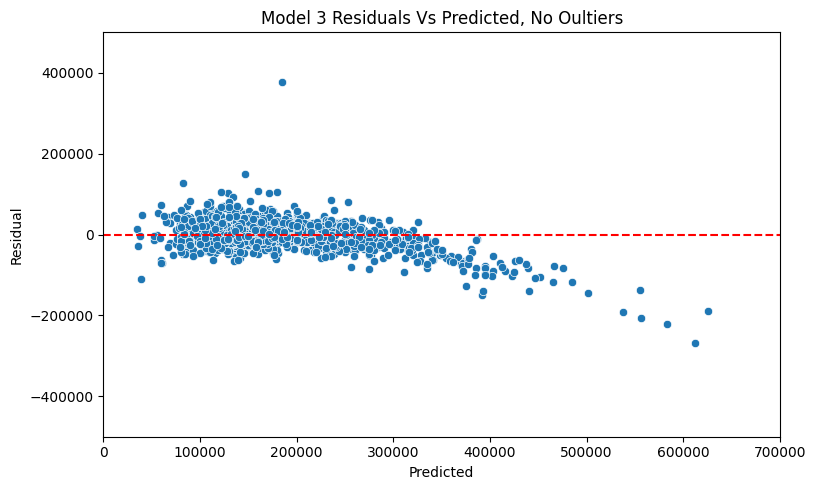

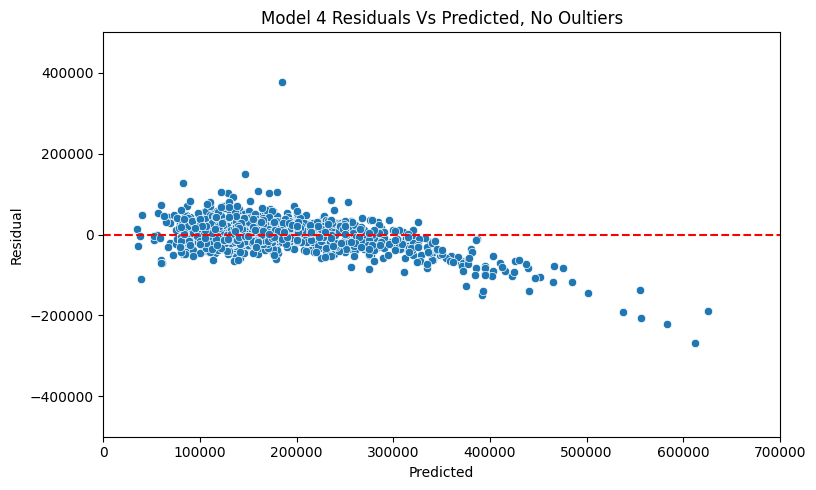

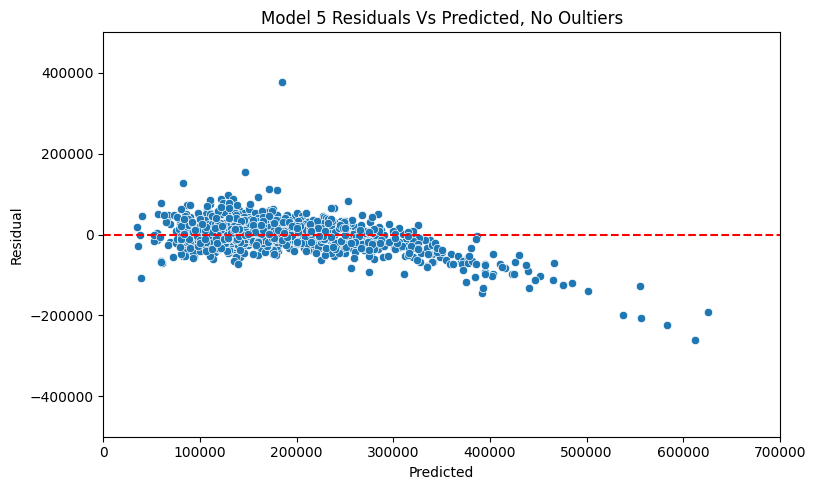

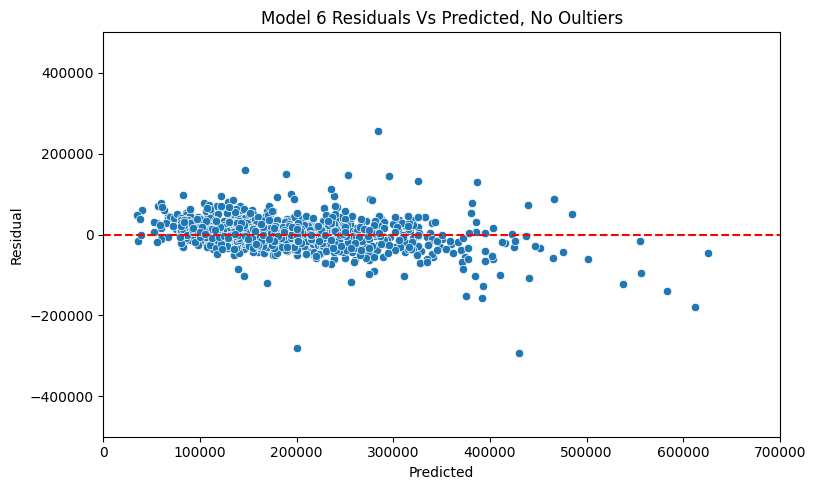

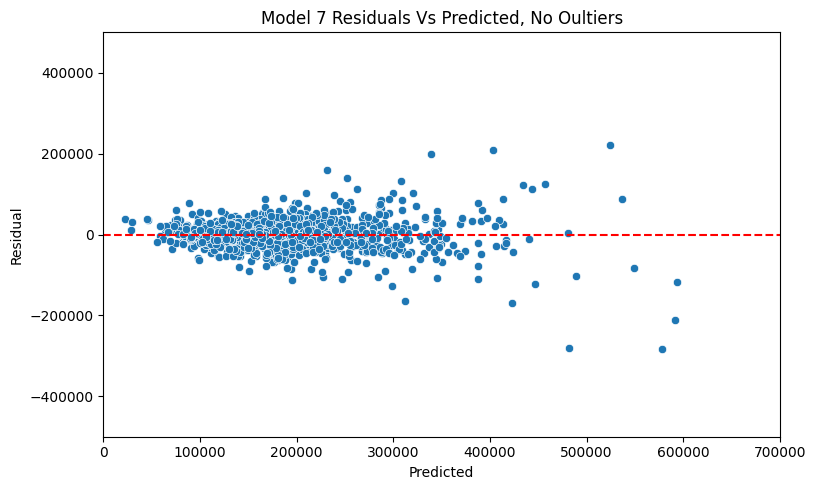

In [87]:
# taking another look at the scatterplots, adjsuted axes


for model, metrics in all_metrics_dict.items():
      # y_true = np.array(metrics['y_true'])
      y_pred = np.array(metrics['y_pred'])
      residuals = np.array(metrics['residuals'])

      plt.figure(figsize=(8, 5))
      sns.scatterplot(x=y_pred, y=residuals)
      plt.axhline(0, color='red', linestyle='--')
      plt.title(f'{model} Residuals Vs Predicted, No Oultiers')
      plt.ylabel("Residual")
      plt.xlabel('Predicted')
      plt.tight_layout()
      plt.ylim(-500000, 500000)
      plt.xlim(0, 700000)
      plt.show()

## Metrics Comparison Across Cross-Validation Folds

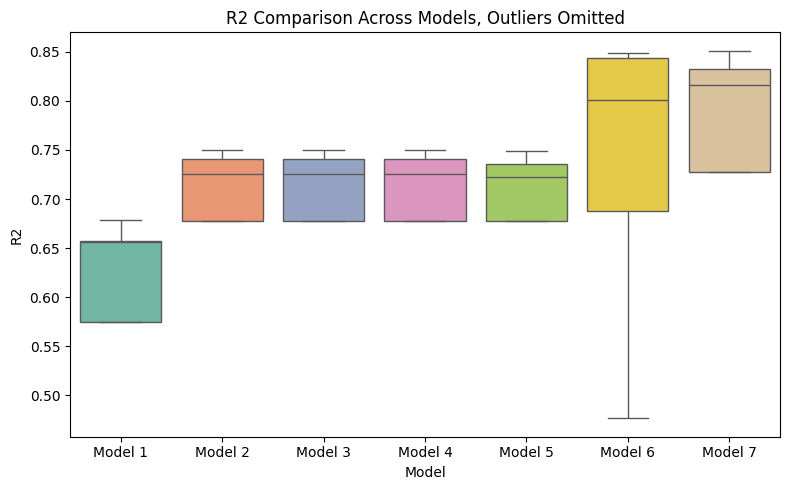

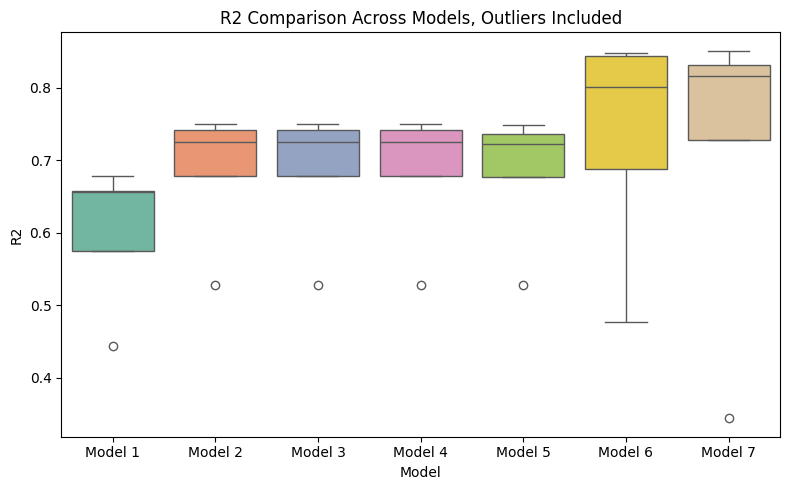

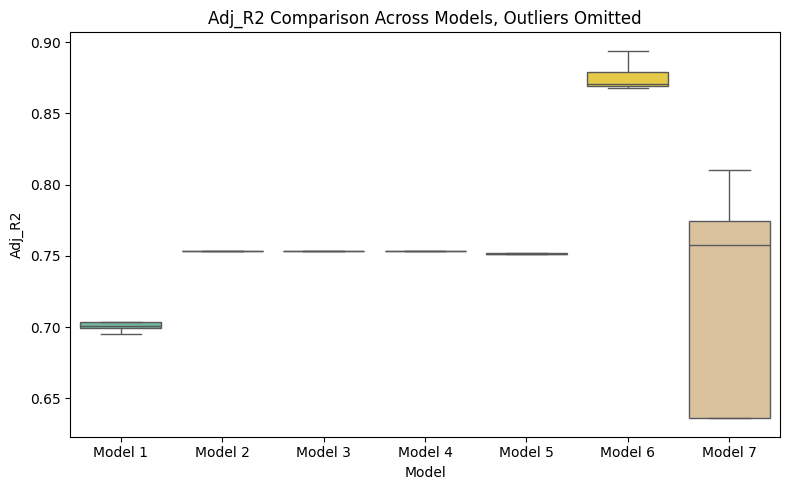

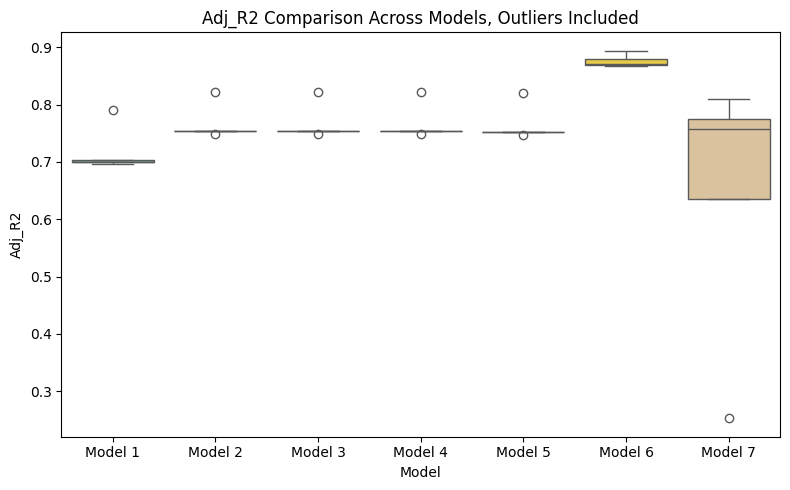

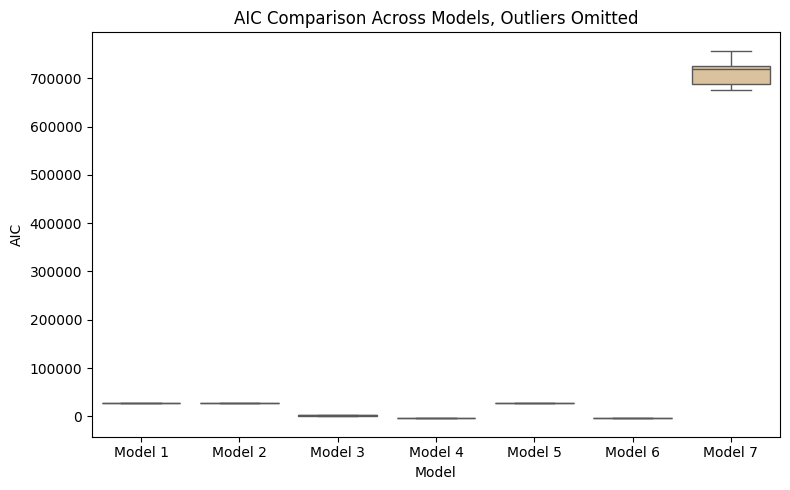

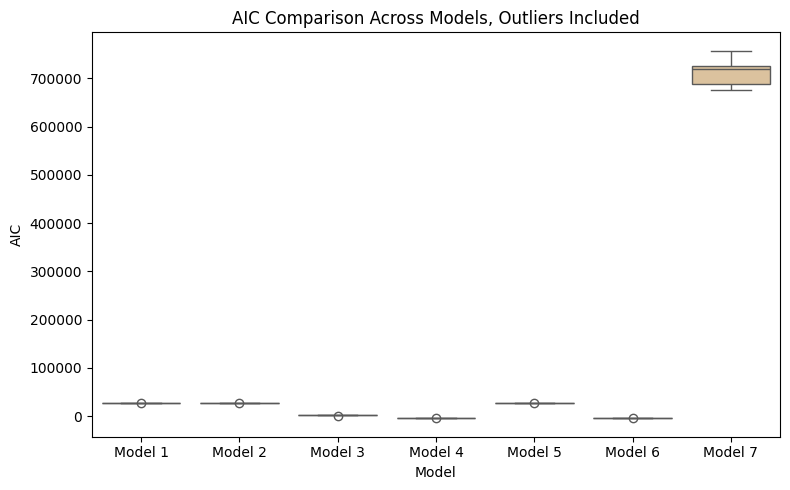

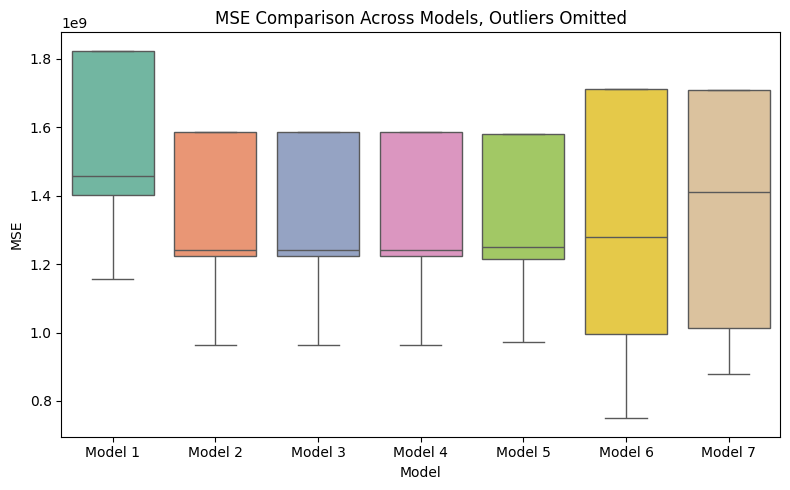

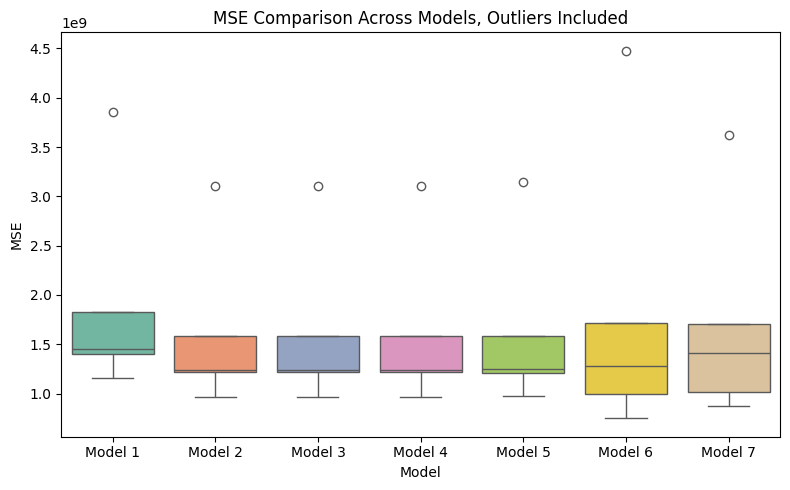

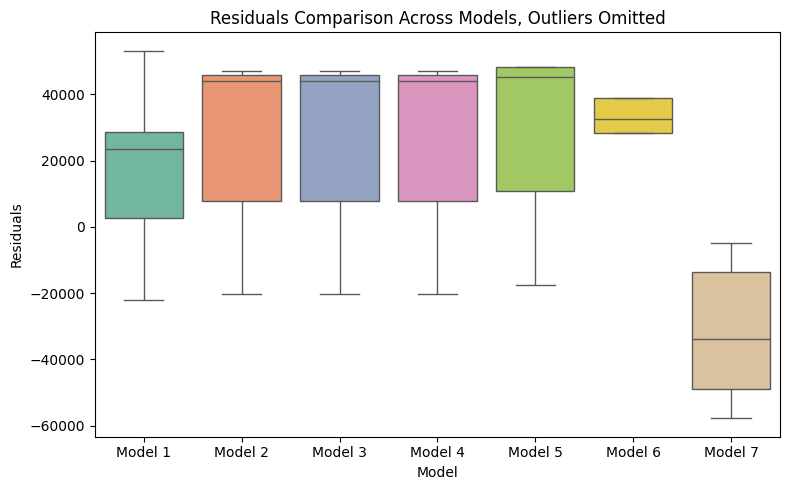

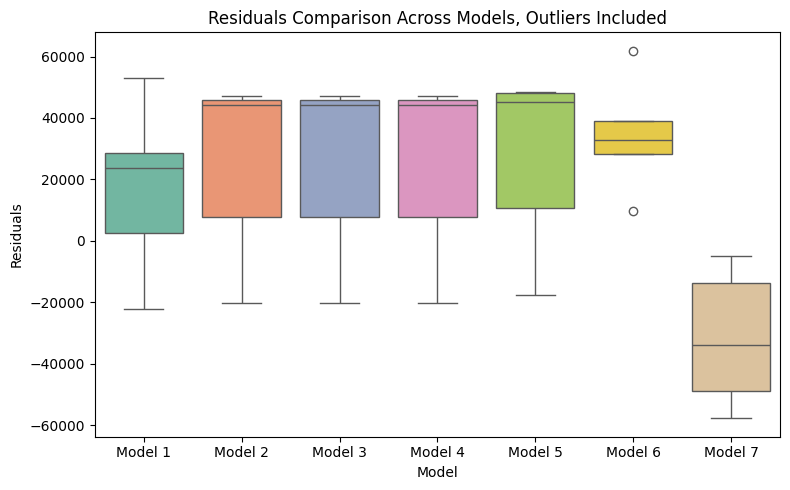

In [88]:
# Suppose this is your cross-validation metrics structure flattened:
# Replace this with your real data
records = []
for model, metrics in all_metrics_dict.items():  # all_metrics is your metrics dict
    for i in range(len(metrics['r2'])):
        records.append({
            'Model': model,
            'R2': metrics['r2'][i],
            'Adj_R2': metrics['adj_r2'][i],
            'AIC': metrics['aic'][i],
            'MSE': metrics['mse'][i],
            "Residuals": metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Models, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Models, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


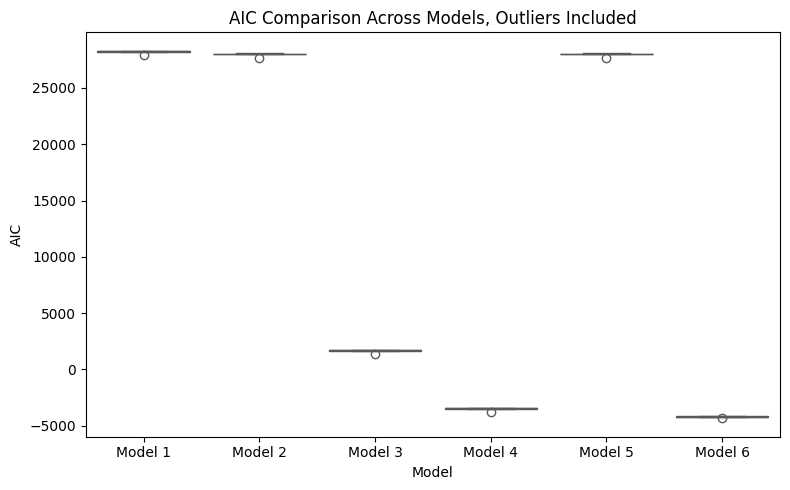

In [89]:
# a look at AIC just for model 1-6
view_1_6 = df_cv[df_cv["Model"]!="Model 7"]

plt.figure(figsize=(8, 5))
subset = view_1_6[view_1_6['Metric'] == "AIC"]
sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
plt.title(f'AIC Comparison Across Models, Outliers Included')
plt.ylabel("AIC")
plt.xlabel('Model')
plt.tight_layout()
plt.show()

# Chosing a model

The seven models tested ranged widely in their cross-validation metrics, and it's aevident that further work would be needed to confidently chose a model for predictions.

## R2 and Adjusted R2 Evaluation
While Model 7 (MinMax + GAM) had the greatest median R2 and the overall spread landed higher, the model also had the greatest outlying negative R2, indicating that model did not fit well across different folds of the dataset. While this could indicate that a specific fold had outlying data, it can also mean that the GAM model requires more attention to parameter tuning. Model 6 (Polynomial Regression) similarly had a high median R2 and outlying negative R2 values.

Model 2 (Linear Regression), Model 3 (Standard Scale + Regression), Model 4 (MinMax Scale + Regression), and Model 5 (Forward Selection + Linear Regression) had the next highest R2 values, a measure that the predictors reliably explain the output Y, and did not have any outlying values which could indicate poor fit.

The Adjusted R2 values followed similar trends as for R2, as mentioned above.

## AIC Evaluation
The AIC for Model 4 (Linear Regression + MinMax Scaling) had the lowest spread of AIC values, followed by Model 3 (Linear Regression + Standard Scaling). This could be attributed to the scaling measures, which reduced instability caused by features on different numeric scales. These models differed from Model 1 only by scaling, so it is possible that scaling is a necessary transformation over this dataset, given the dramatic difference in AIC.

## MSE Evaluation
Model 2, 3, 4  and Model 5 nearly tied for the lowest median MSE value. While Model 6 and 7 had lower 25th quartile MSE values, these models also had the widest spread into the positive values.  Models 2 through 5 better fit the data across folds, and gives evidence that the models neither underfit or overfit given unseen data.

# Residual Plot Analysis and Boxplot Evaluation
All residual scatterplots indicate some pattern which casts doubt on the ability to ensure model assumptions are met. In evaluating the scatterplots with outliers omitted, Model 6 (Polynomial Regression) had the most patternless scatterplot. The points clustered around 0 with no shape, indicating less heteroscadacity or variance among residuals, giving more reliability to regression analysis. Model 7 (GAM) scatterplot looks similar, but suffered more extreme outliers when the full set of residuals are included.

The majority of the models held a cone-like shape, indicating that there is non-constant variance among errors and so less confidence can be given to standard errors and conclusions about the model fit. These models potentially may benefit from require another layer of transformation, or a weighted regression fit.

The boxplots are anotherway to visualize the variance in residuals, where model 6 and 7 have less spread and median residual values closer to 0 than the remaining models.

# Next Steps
While no one model excells at all metrics atttempted, models 2 through 5 showed the most balance in measures of fit. Before running the final model through the test set, the Y values for these four models will be Log transformed to address funnel shaped residuals.

## Log Transformed Model 2

In [90]:
# Original residuals show funnel
X2 = df_features[['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']]
y2 = df_features['SalePrice']
X2_const = add_constant(X2)

# Log-transform Y
y_2_log = np.log(y2)

# Refit
model_log_2 = sm.OLS(y_2_log, X2_const).fit()
model_log_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        15:00:57   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            4.5760      0.539      8.492      0.000       3.519       5.633
TotalBsmtSF      0.0001   1.31e-05     10.323      0.000       0.000       0.000
GrLivArea        0.0002   1.28e-05     15.519      0.000       0.000       0.000
FullBath         0.0245      0.012      2.101      0.036       0.002       0.047
GarageArea       0.0003   2.76e-05     11.424      0.000       0.000       0.000
OverallQual      0.1100      0.005     20.977      0.000       0.100       0.120
YearRemodAdd     0.0031      0.000     11.122      0.000       0.003       0.004
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                     3.25e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.25e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [91]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X2):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X2.iloc[train_idx] if hasattr(X2, 'iloc') else X2[train_idx]
    X_test = X2.iloc[test_idx] if hasattr(X2, 'iloc') else X2[test_idx]
    y_train = np.log(y2[train_idx])
    y_test = np.log(y2[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train, y_test)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [92]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_2_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_2_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6610
mse       : 6131036804.4413
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 179663.1594
y_pred    : 180921.1959
residuals : -1258.0365
adj_r2    : 0.8063
aic       : -748.1339


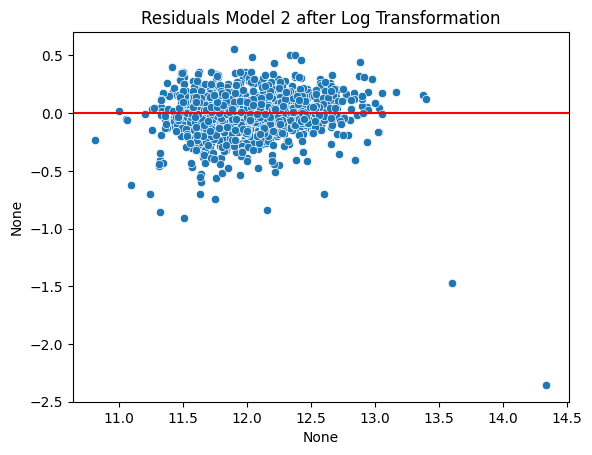

In [93]:
residuals_log = model_log_2.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_2.fittedvalues, y=residuals_log)
plt.title("Residuals Model 2 after Log Transformation")
plt.axhline(0, color='red')

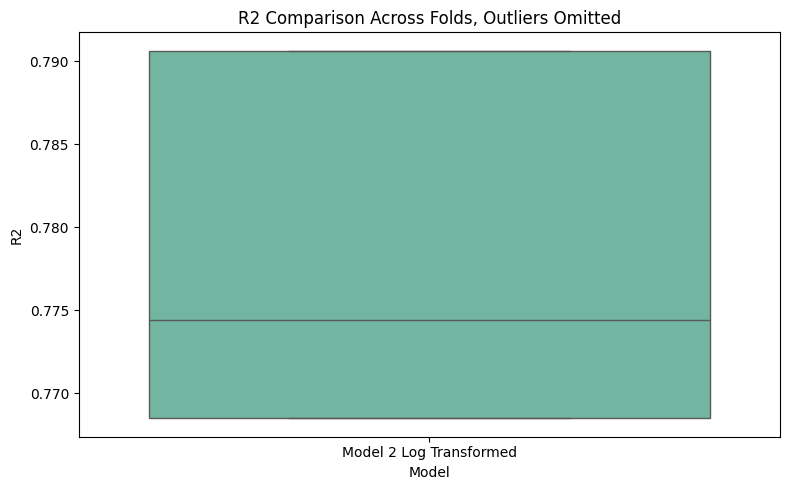

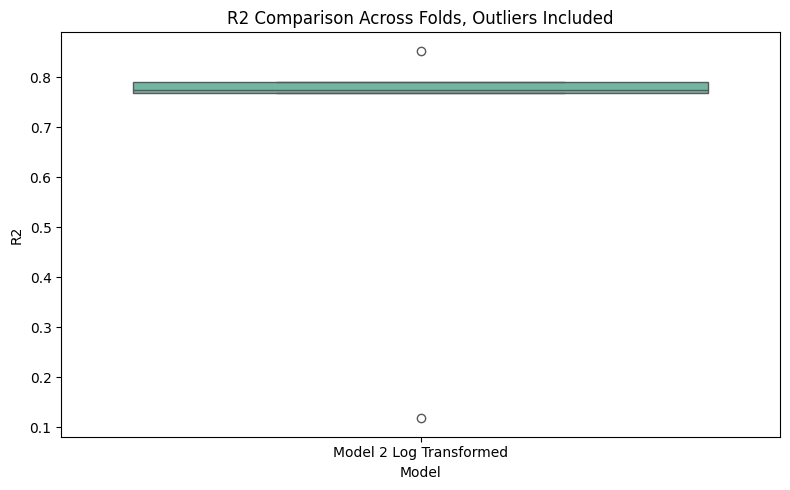

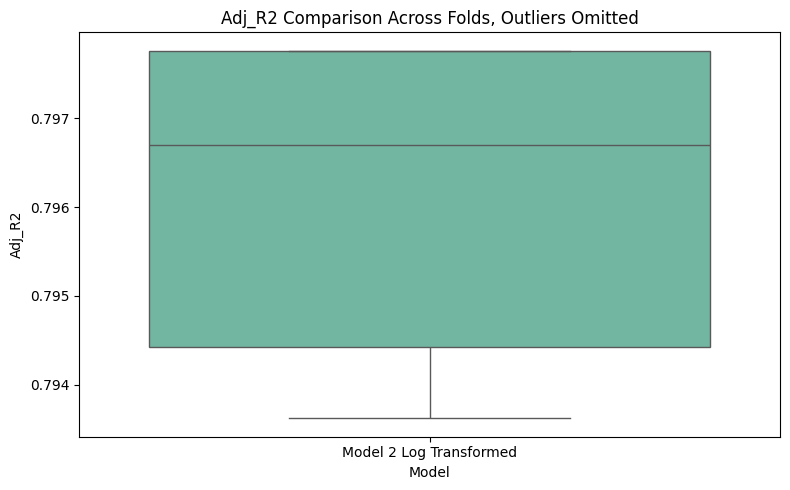

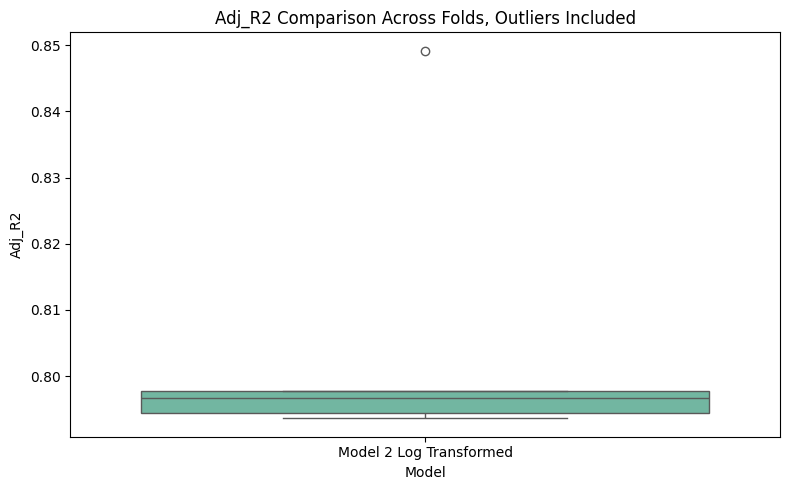

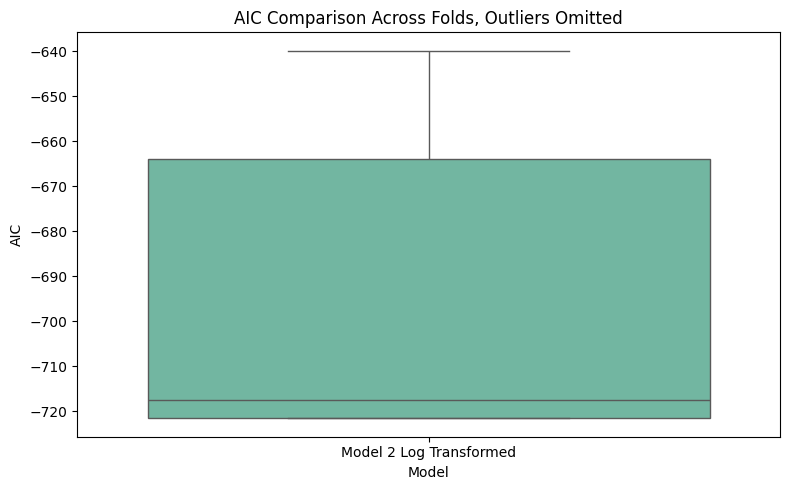

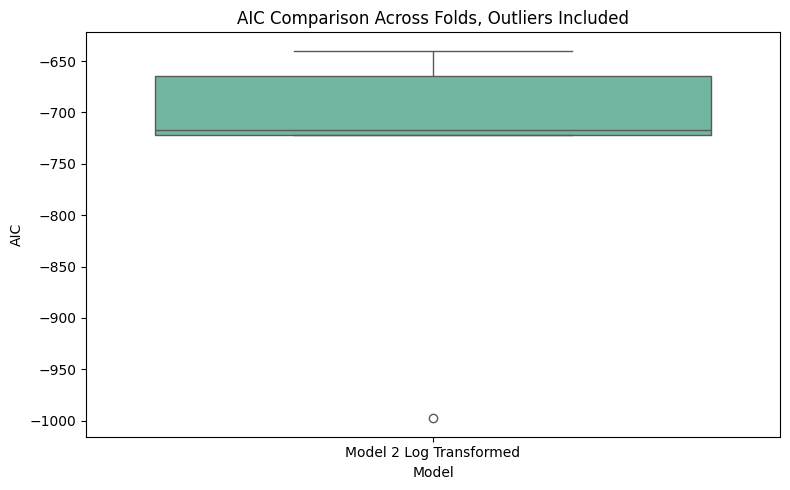

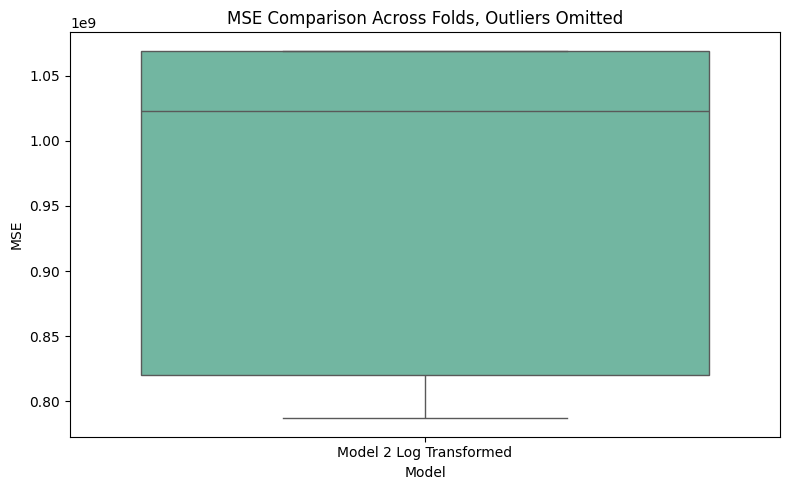

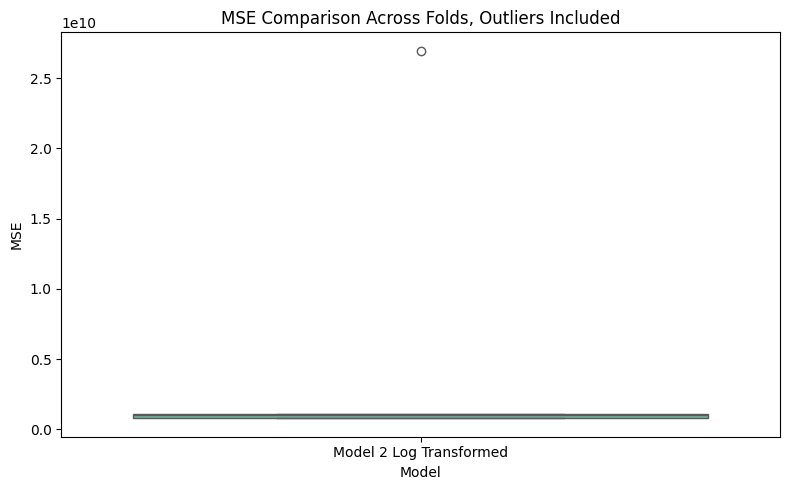

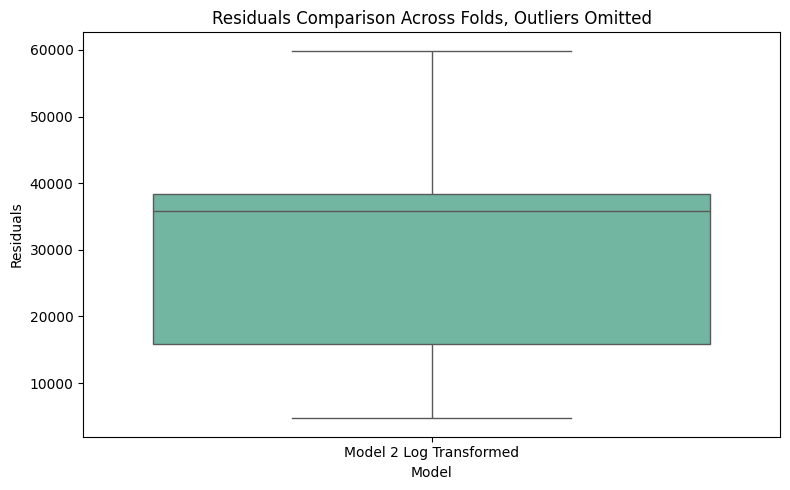

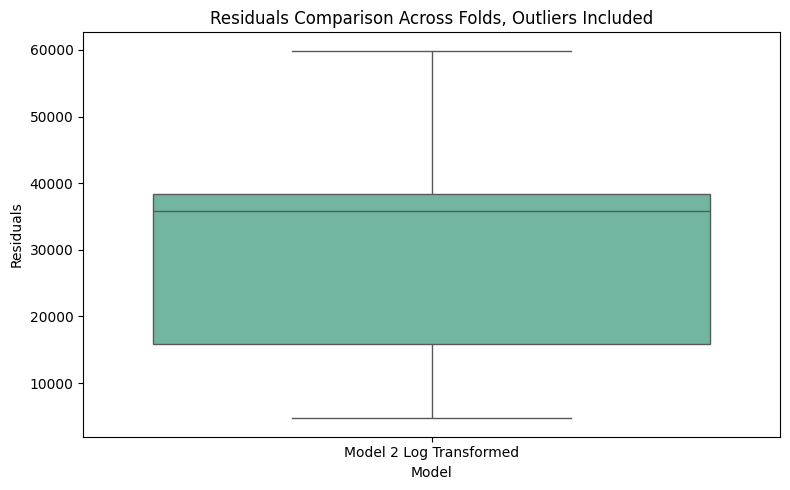

In [94]:
records = []
for i in range(len(model_2_log_metrics['r2'])):
        records.append({
            'Model': 'Model 2 Log Transformed',
            'R2': model_2_log_metrics['r2'][i],
            'Adj_R2': model_2_log_metrics['adj_r2'][i],
            'AIC': model_2_log_metrics['aic'][i],
            'MSE': model_2_log_metrics['mse'][i],
            "Residuals": model_2_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 3

In [95]:
X3_scaler = StandardScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X3 = pd.DataFrame(X3_scaler.fit_transform(df_features[columns]), columns=columns)
X3_const = add_constant(X3)

# Log-transform Y
y3 = df_features['SalePrice']
y_3_log = np.log(y3)

# Refit
model_log_3 = sm.OLS(y_3_log, X3_const).fit()
model_log_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        15:01:00   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           12.0241      0.005   2604.036      0.000      12.015      12.033
TotalBsmtSF      0.0595      0.006     10.323      0.000       0.048       0.071
GrLivArea        0.1042      0.007     15.519      0.000       0.091       0.117
FullBath         0.0135      0.006      2.101      0.036       0.001       0.026
GarageArea       0.0674      0.006     11.424      0.000       0.056       0.079
OverallQual      0.1520      0.007     20.977      0.000       0.138       0.166
YearRemodAdd     0.0639      0.006     11.122      0.000       0.053       0.075
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                         3.41
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [96]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X3):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X3.iloc[train_idx] if hasattr(X3, 'iloc') else X3[train_idx]
    X_test = X3.iloc[test_idx] if hasattr(X3, 'iloc') else X3[test_idx]
    y_train = np.log(y3[train_idx])
    y_test = np.log(y3[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train, y_test)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [97]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_3_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_3_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6610
mse       : 6131036804.4408
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 179663.1594
y_pred    : 180921.1959
residuals : -1258.0365
adj_r2    : 0.8063
aic       : -748.1339


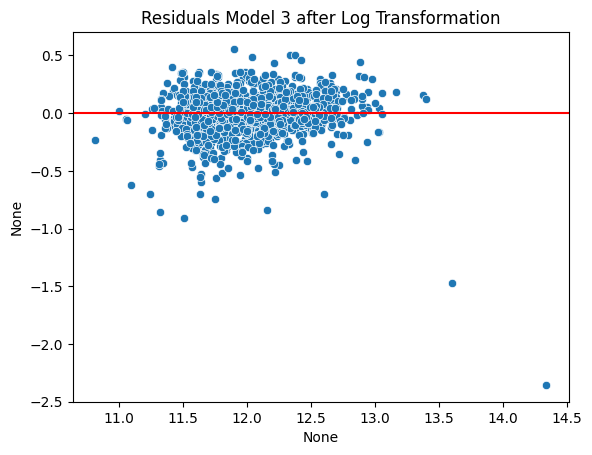

In [98]:
residuals_log = model_log_3.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_3.fittedvalues, y=residuals_log)
plt.title("Residuals Model 3 after Log Transformation")
plt.axhline(0, color='red')

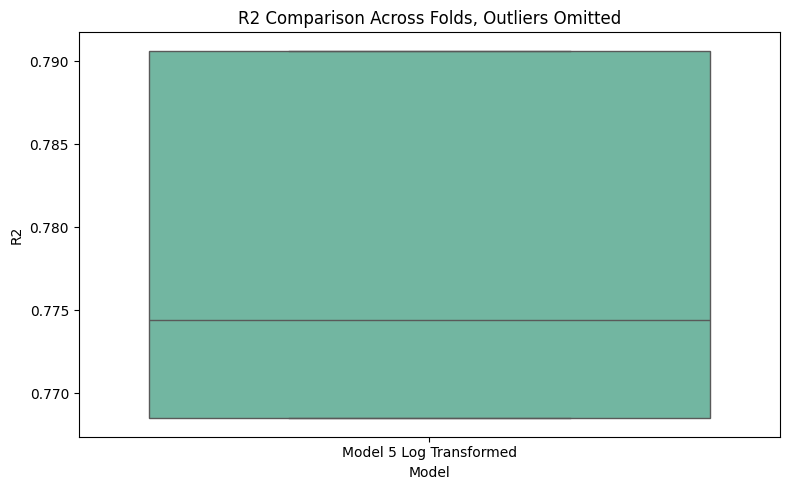

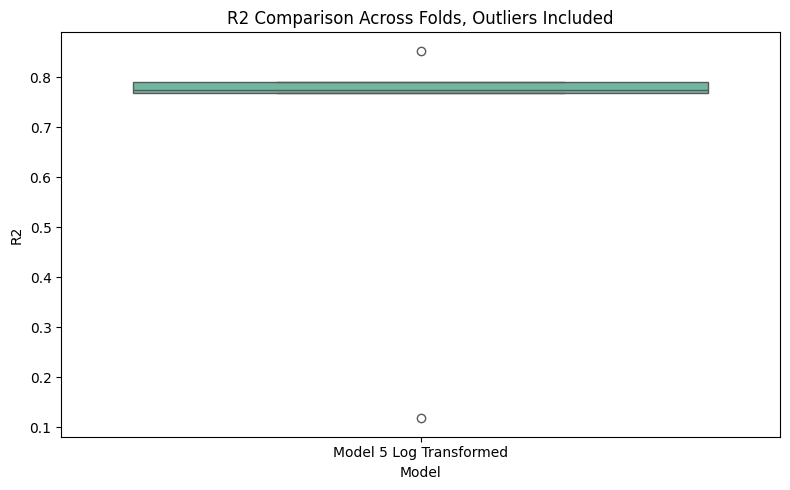

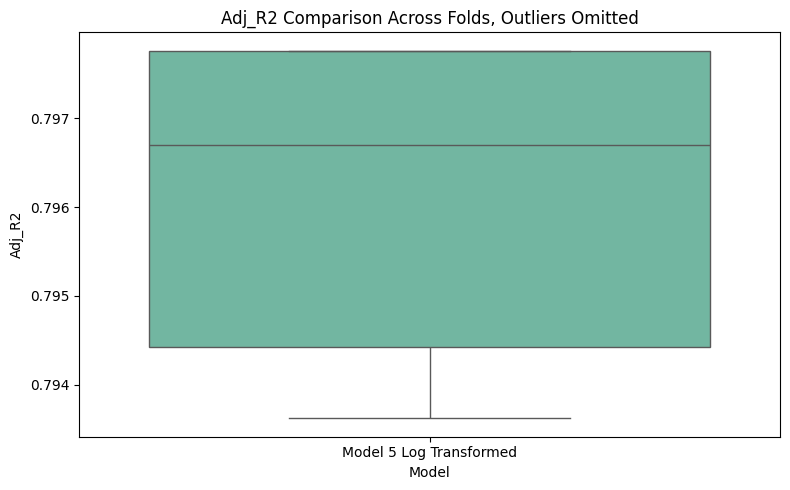

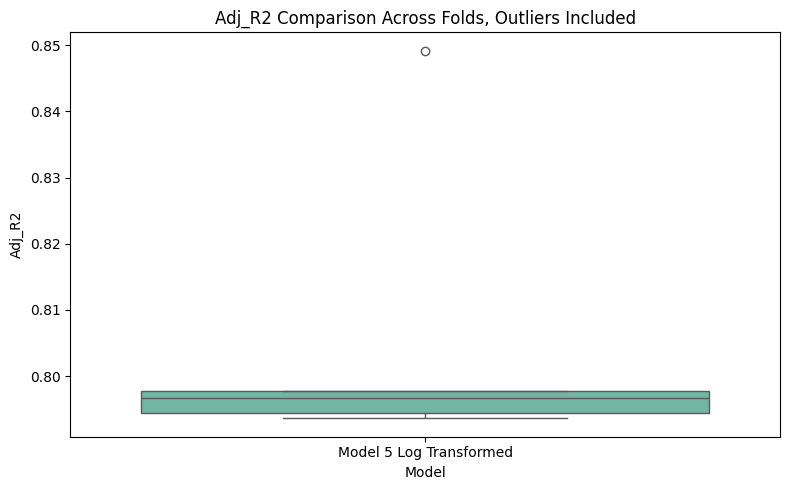

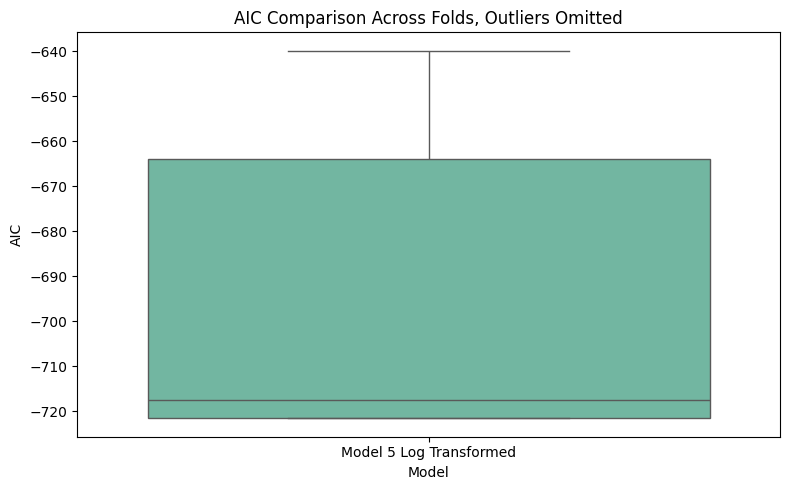

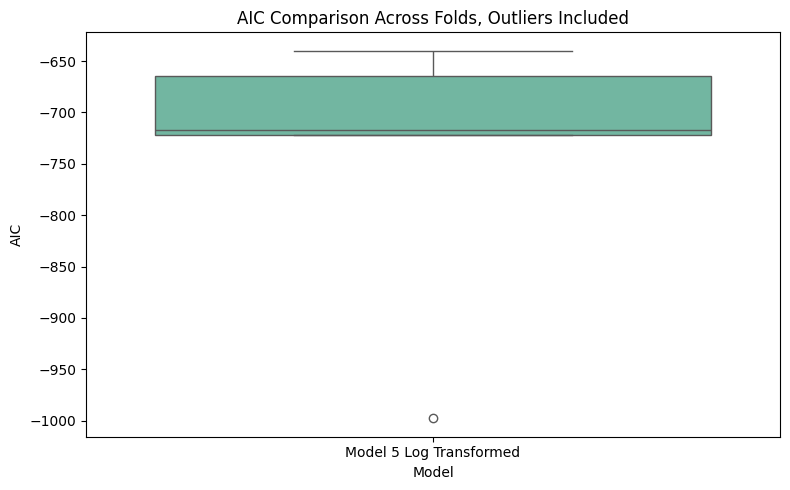

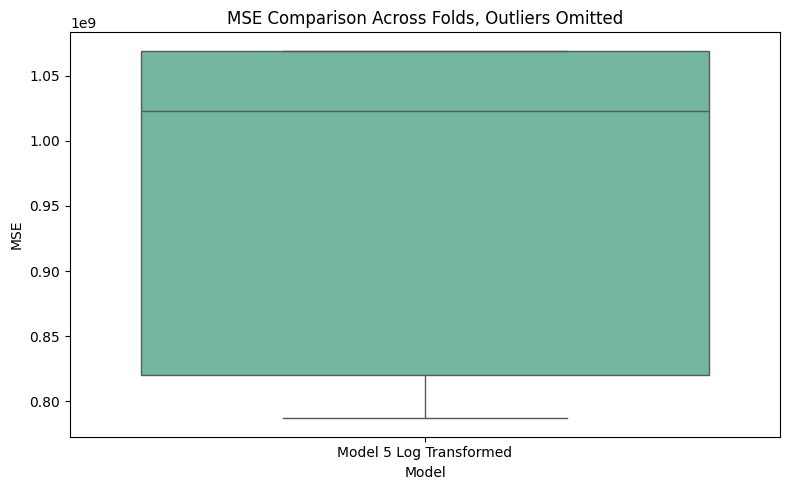

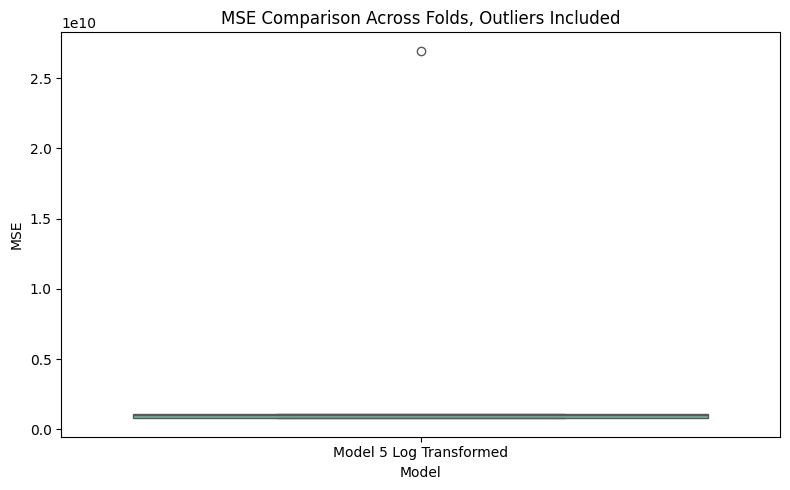

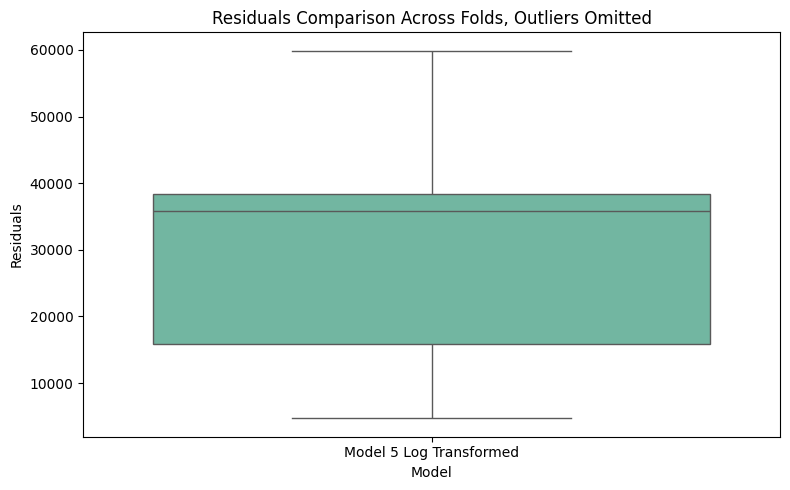

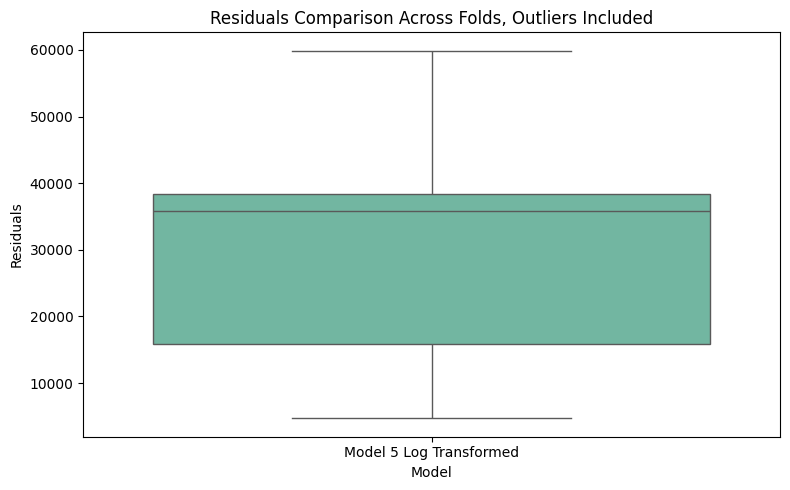

In [99]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_3_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_3_log_metrics['r2'][i],
            'Adj_R2': model_3_log_metrics['adj_r2'][i],
            'AIC': model_3_log_metrics['aic'][i],
            'MSE': model_3_log_metrics['mse'][i],
            "Residuals": model_3_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 4

In [100]:
min_max_x_scaler = MinMaxScaler()

columns = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']

X4 = pd.DataFrame(min_max_x_scaler.fit_transform(df_features[columns]), columns=columns)
X4_const = add_constant(X4)

# Log-transform Y\
y4 = df_features['SalePrice']
y_4_log = np.log(y4)

# Refit
model_log_4 = sm.OLS(y_4_log, X4_const).fit()
model_log_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.806
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     1004.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        15:01:03   Log-Likelihood:                 464.69
No. Observations:                1460   AIC:                            -915.4
Df Residuals:                    1453   BIC:                            -878.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           10.7900      0.019    574.911      0.000      10.753      10.827
TotalBsmtSF      0.8290      0.080     10.323      0.000       0.671       0.987
GrLivArea        1.0528      0.068     15.519      0.000       0.920       1.186
FullBath         0.0735      0.035      2.101      0.036       0.005       0.142
GarageArea       0.4474      0.039     11.424      0.000       0.371       0.524
OverallQual      0.9896      0.047     20.977      0.000       0.897       1.082
YearRemodAdd     0.1858      0.017     11.122      0.000       0.153       0.219
==============================================================================
Omnibus:                     1012.245   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            44850.205
Skew:                          -2.669   Prob(JB):                         0.00
Kurtosis:                      29.623   Cond. No.                         26.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [101]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X4):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X4.iloc[train_idx] if hasattr(X4, 'iloc') else X4[train_idx]
    X_test = X4.iloc[test_idx] if hasattr(X4, 'iloc') else X4[test_idx]
    y_train = np.log(y4[train_idx])
    y_test = np.log(y4[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train, y_test)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [102]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_4_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_4_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6610
mse       : 6131036804.4409
rmse      : 57111.7119
mae       : 22862.3458
y_true    : 179663.1594
y_pred    : 180921.1959
residuals : -1258.0365
adj_r2    : 0.8063
aic       : -748.1339


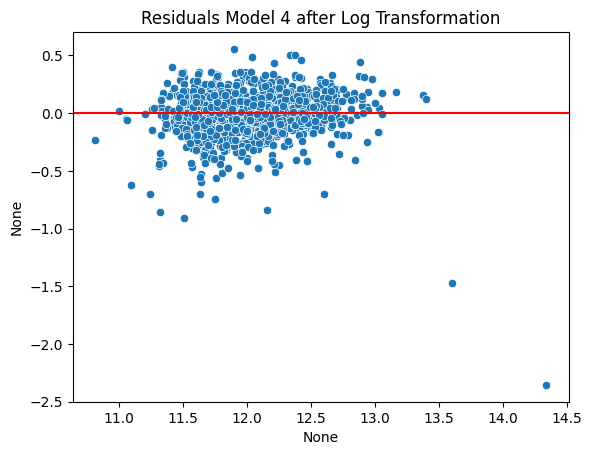

In [103]:
residuals_log = model_log_4.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_4.fittedvalues, y=residuals_log)
plt.title("Residuals Model 4 after Log Transformation")
plt.axhline(0, color='red')

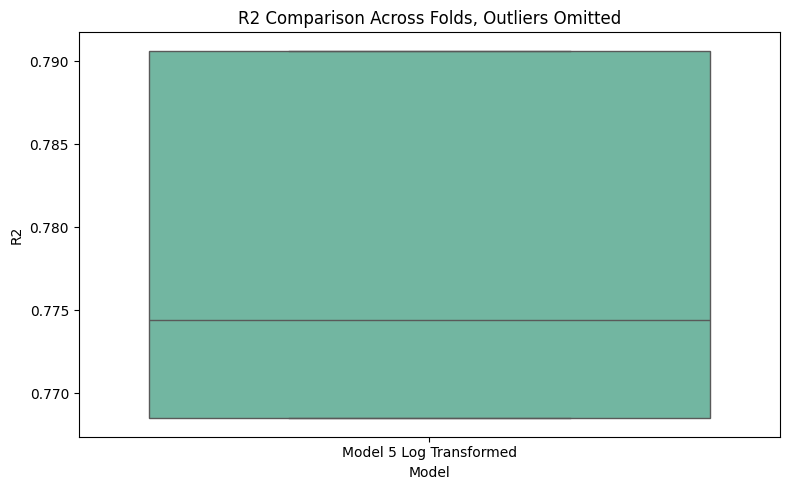

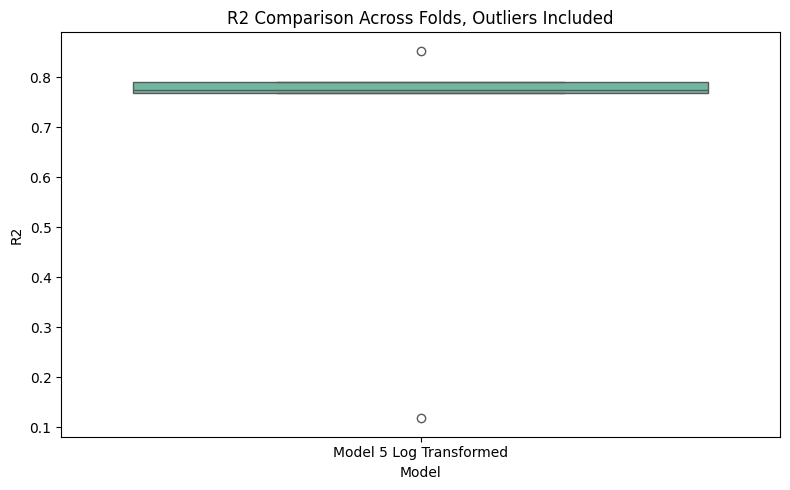

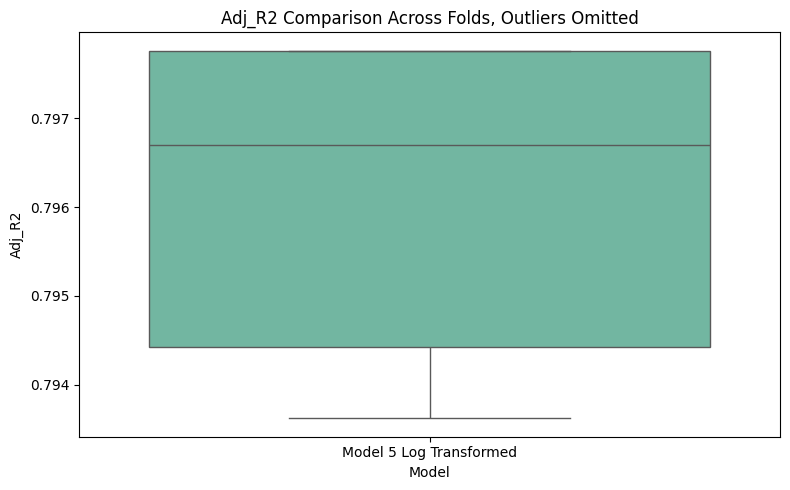

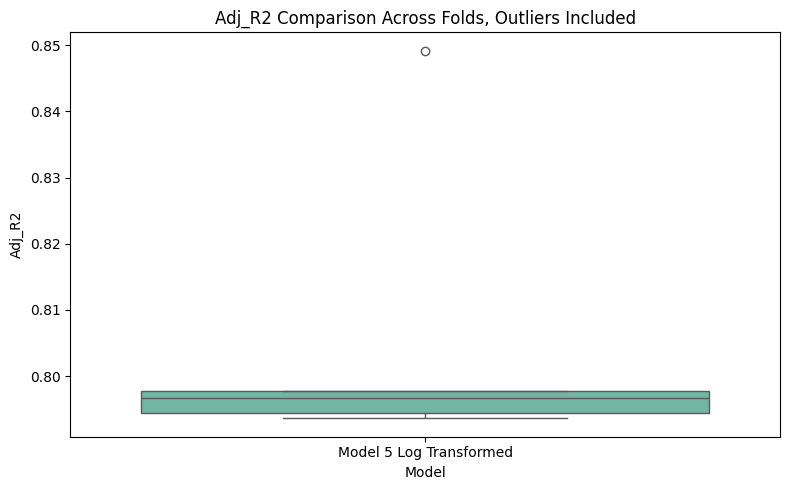

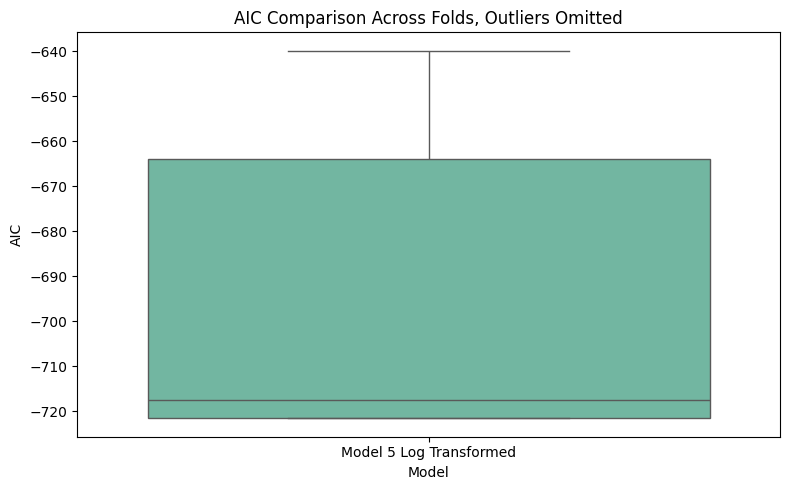

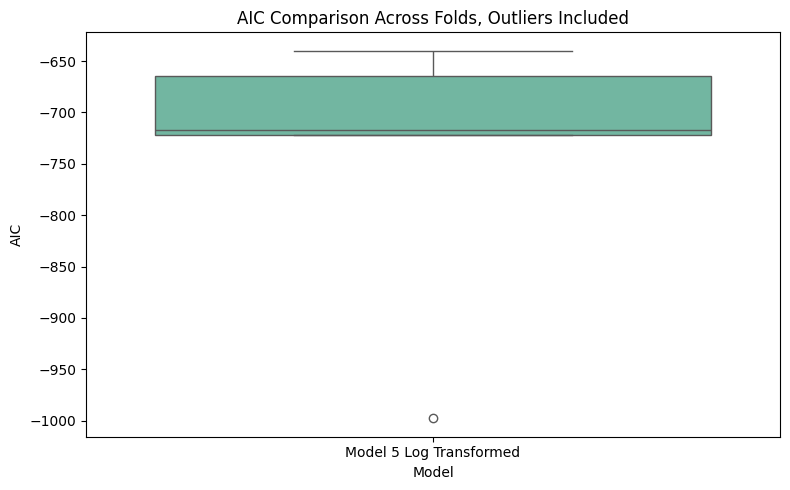

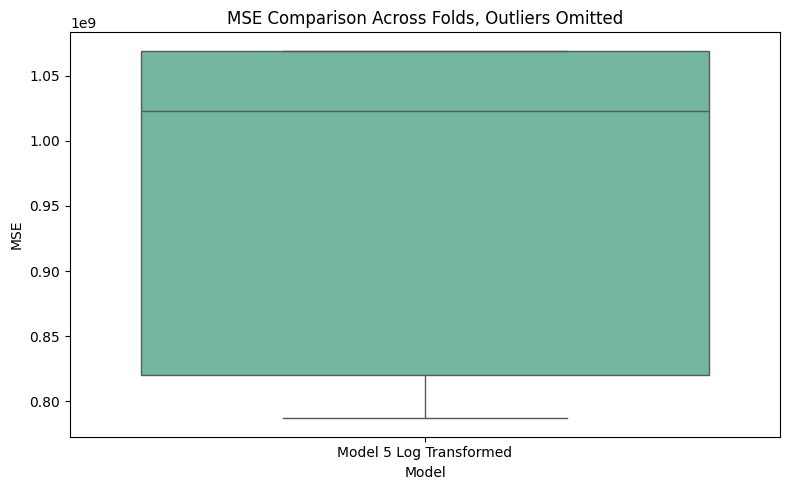

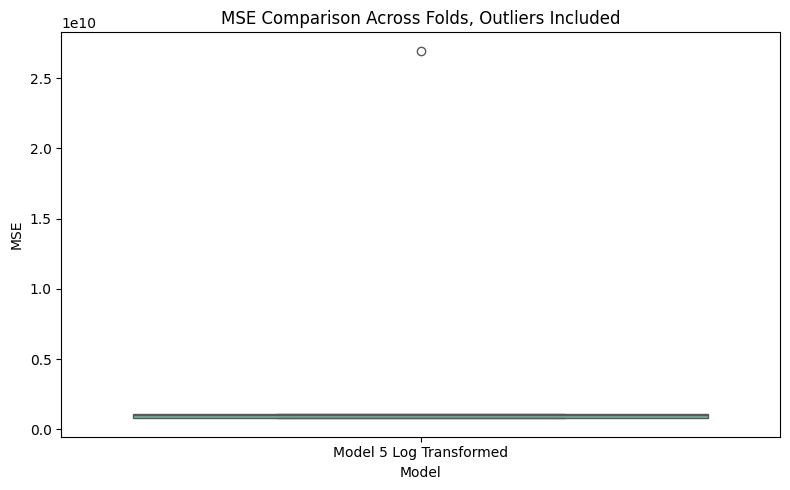

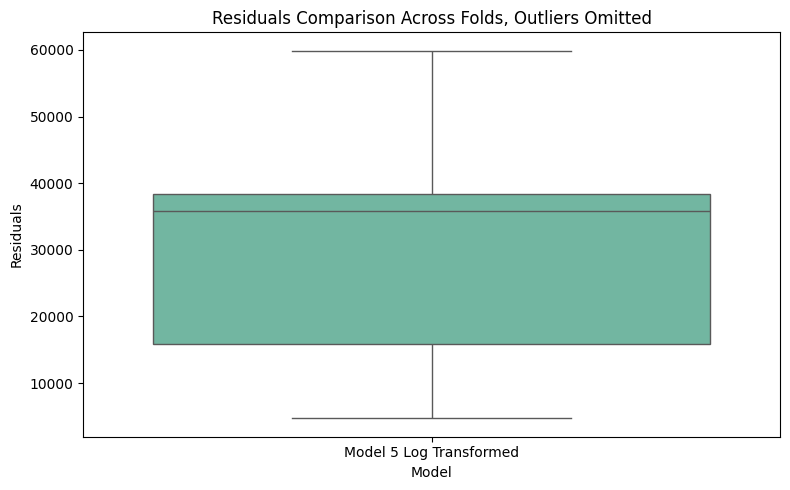

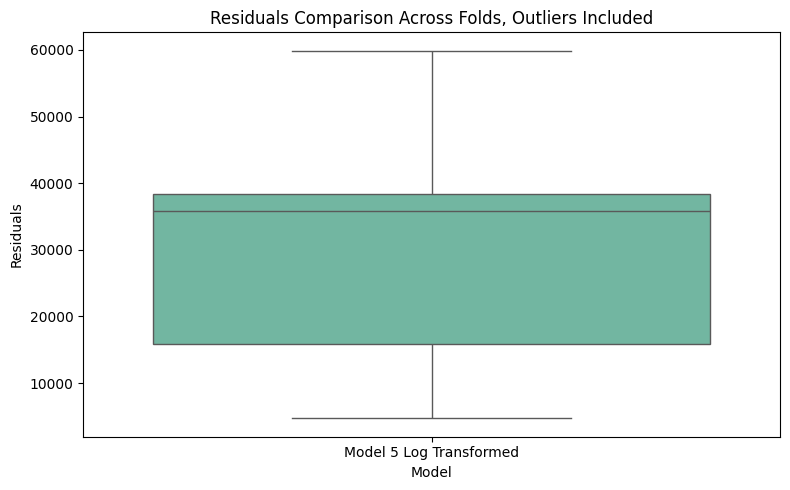

In [104]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_4_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_4_log_metrics['r2'][i],
            'Adj_R2': model_4_log_metrics['adj_r2'][i],
            'AIC': model_4_log_metrics['aic'][i],
            'MSE': model_4_log_metrics['mse'][i],
            "Residuals": model_4_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Log Transformed Model 5

In [105]:
# model with selected features
X5 = df_features[feat_names]
y5 = df_features['SalePrice']
X5_const = add_constant(X5)

# Log-transform Y
y_5_log = np.log(y5)

# Refit
model_log_5 = sm.OLS(y_5_log, X5_const).fit()
model_log_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.803
Method:                 Least Squares   F-statistic:                     1489.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        15:01:06   Log-Likelihood:                 456.95
No. Observations:                1460   AIC:                            -903.9
Df Residuals:                    1455   BIC:                            -877.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            4.4124      0.525      8.403      0.000       3.382       5.442
GarageArea       0.0003   2.77e-05     11.013      0.000       0.000       0.000
OverallQual      0.1120      0.005     21.470      0.000       0.102       0.122
YearRemodAdd     0.0032      0.000     11.752      0.000       0.003       0.004
TotalSqFeet      0.0002   7.99e-06     22.486      0.000       0.000       0.000
==============================================================================
Omnibus:                     1095.668   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            62479.145
Skew:                          -2.933   Prob(JB):                         0.00
Kurtosis:                      34.506   Cond. No.                     3.79e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.79e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [106]:
## cross validation
prediction_list = []
y_true_list = []
model_list = []

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in kf.split(X5):
    # Support both NumPy arrays and pandas DataFrames
    X_train = X5.iloc[train_idx] if hasattr(X5, 'iloc') else X5[train_idx]
    X_test = X5.iloc[test_idx] if hasattr(X5, 'iloc') else X5[test_idx]
    y_train = np.log(y5[train_idx])
    y_test = np.log(y5[test_idx])

    preds, model = return_predictions(X_train, X_test, y_train, y_test)
    prediction_list.append(preds)
    y_true_list.append(y_test)
    model_list.append(model)


In [107]:
# exponentiate for better comparison
prediction_list = [np.exp(p) for p in prediction_list]
y_true_list = [np.exp(y) for y in y_true_list]

# # cross validation to obtain metrics needed for later evaluation
model_5_log_metrics = return_cross_validation_metrics(y_true_list, prediction_list, model_list)
print_cross_validation_metrics(model_5_log_metrics)

Cross-Validated Goodness-of-Fit Summary:
--------------------------------------------------
r2        : 0.6550
mse       : 7394934284.1595
rmse      : 60823.3581
mae       : 23064.9877
y_true    : 179834.8729
y_pred    : 180921.1959
residuals : -1086.3230
adj_r2    : 0.8046
aic       : -740.3677


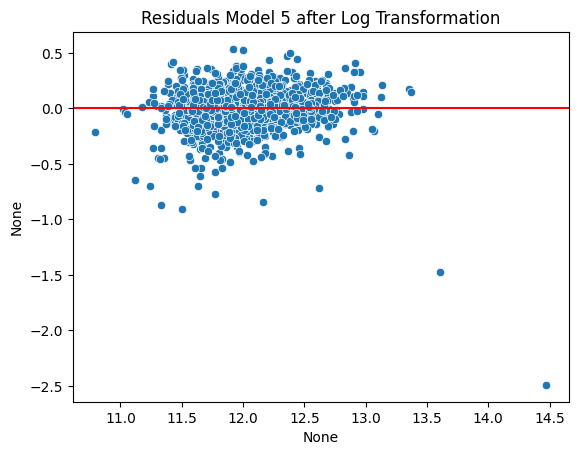

In [108]:
residuals_log = model_log_5.resid

# Compare residual plots side-by-side
sns.scatterplot(x=model_log_5.fittedvalues, y=residuals_log)
plt.title("Residuals Model 5 after Log Transformation")
plt.axhline(0, color='red')

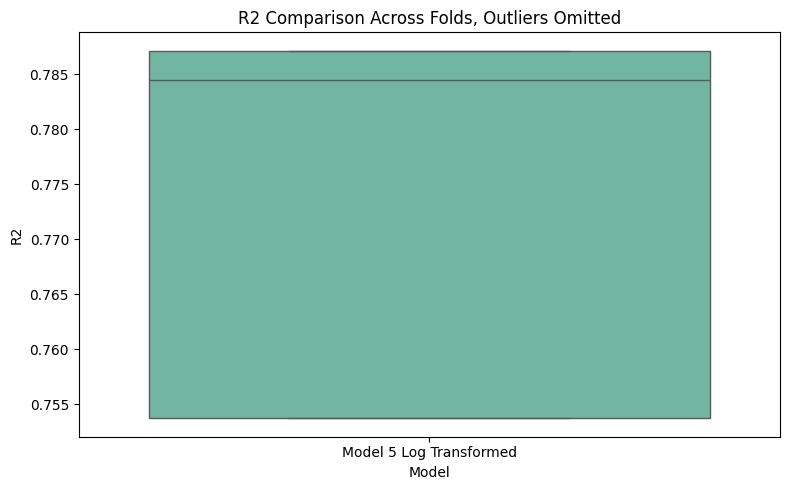

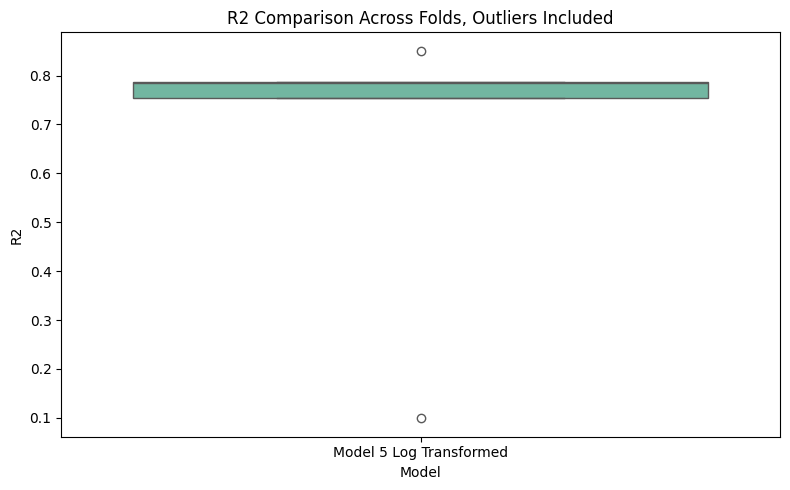

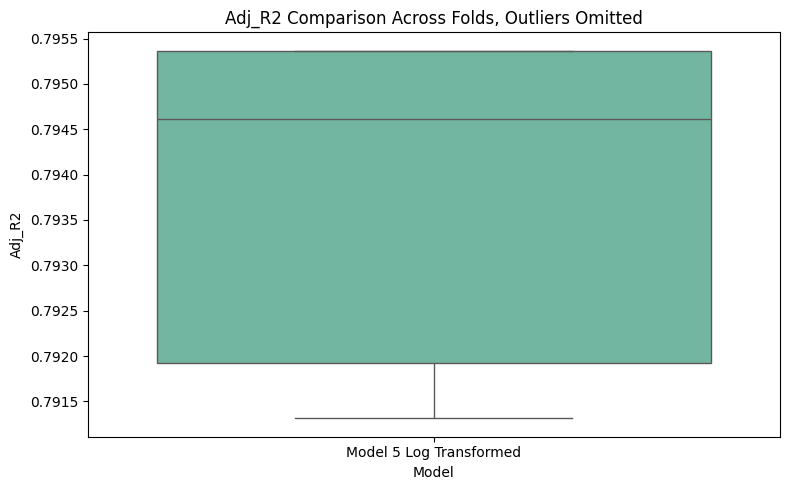

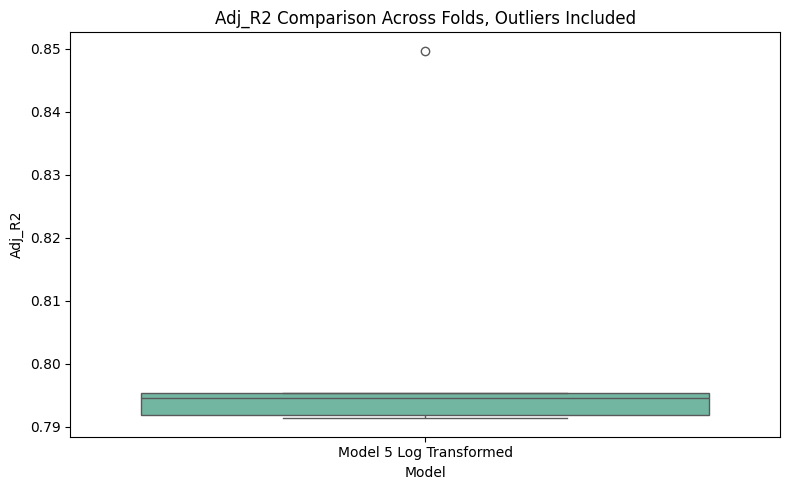

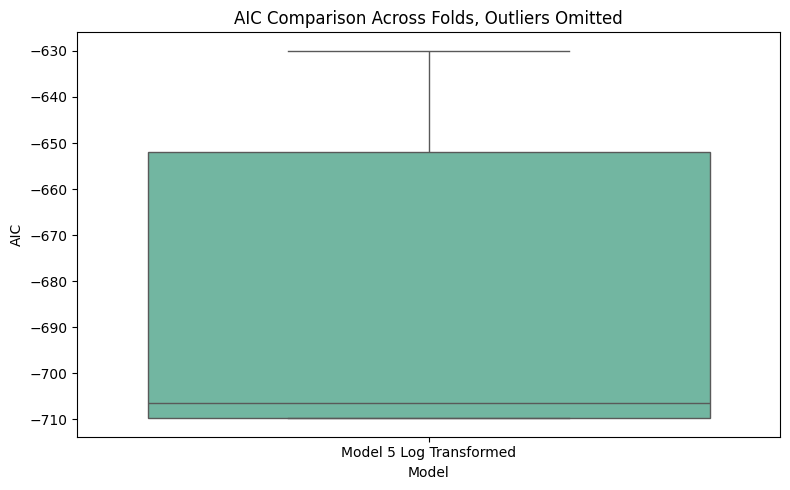

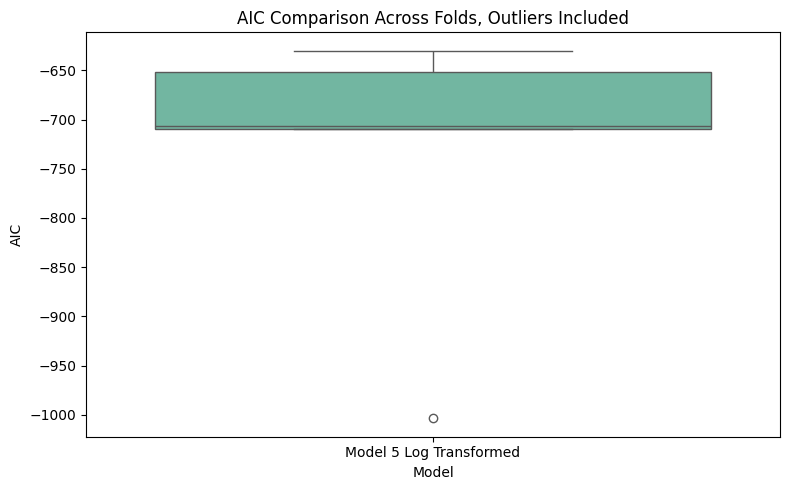

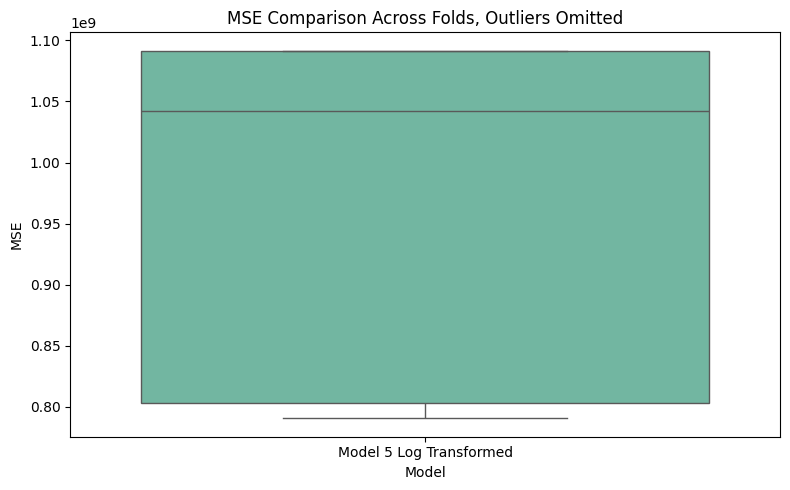

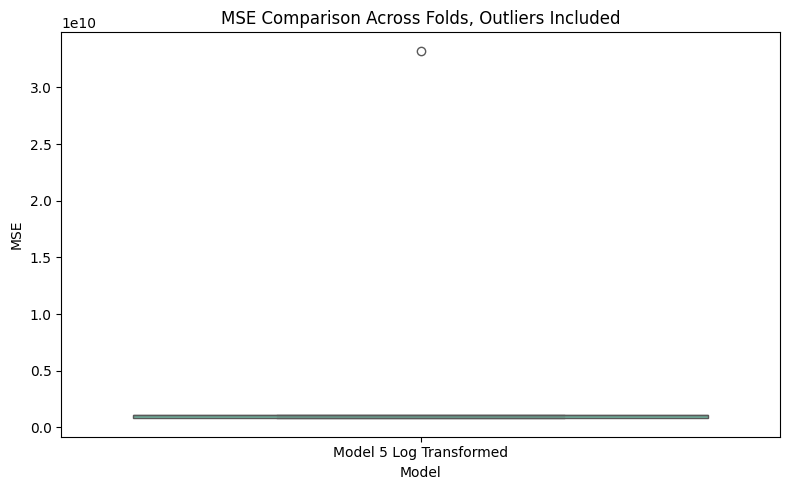

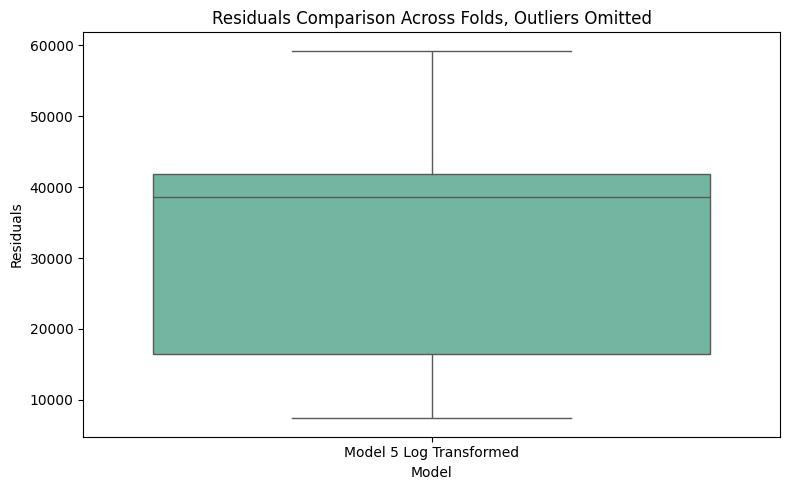

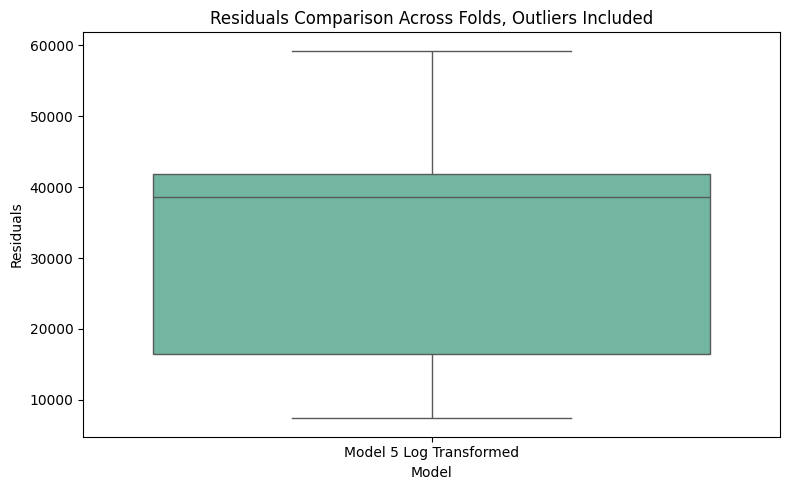

In [109]:
# replotting our boxplots for log transformed Model 5
records = []
for i in range(len(model_5_log_metrics['r2'])):
        records.append({
            'Model': 'Model 5 Log Transformed',
            'R2': model_5_log_metrics['r2'][i],
            'Adj_R2': model_5_log_metrics['adj_r2'][i],
            'AIC': model_5_log_metrics['aic'][i],
            'MSE': model_5_log_metrics['mse'][i],
            "Residuals": model_5_log_metrics['residuals'][i]
        })

# Create a long-form DataFrame
df_cv = pd.DataFrame(records).melt(id_vars='Model', var_name='Metric', value_name='Value')

# Generate one boxplot per metric
unique_metrics = df_cv['Metric'].unique()

for metric in unique_metrics:
    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model', showfliers=False)
    plt.title(f'{metric} Comparison Across Folds, Outliers Omitted')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 5))
    subset = df_cv[df_cv['Metric'] == metric]
    sns.boxplot(data=subset, x='Model', y='Value', palette='Set2', hue='Model')
    plt.title(f'{metric} Comparison Across Folds, Outliers Included')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.tight_layout()
    plt.show()


## Final Model
The Log Transformed Model 2 through 5 had positive effects for many aspects of these models. AIC for all models except Model 4 decreased dramatically across folds, indicating that the models are better suited to predict unseen data now. Residual plots have lost their funnel shape, and remaining outlier residuals may require a deeper look at leverage or outliers in the dataset. Thanks to the log scaling, differences MinMax or Standard scaling on certain regression metrics like R2 and AIC between Models 2-4 are gone.

While all log transformed Models were very similar in all metrics, Model 2 and 5 still show signs of multicollinearity and so will be avoided in the final run. Model 4 will be chosen as the final model, although Model 3 would likely return identical if not very similar results.


# Predictions for Test Dataset

In [110]:
# pulling in the test dataset
test_file_path = project_path + "test.csv"
test_df = pd.read_csv(test_file_path)
print("Full train dataset shape is {}".format(test_df.shape))

Full train dataset shape is (1459, 80)


In [111]:
# get log transformed MinMax
cols = ['TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageArea', 'OverallQual', 'YearRemodAdd']
X_test = test_df[cols]
X_test = pd.DataFrame(min_max_x_scaler.transform(X_test), columns=cols)
X_test = sm.add_constant(X_test, has_constant='add')

# our chosen final model
predictions = model_log_4.predict(X_test)

# since the model is log transformed, need to invert
predictions = np.exp(predictions)

In [112]:
len(predictions)

1459

## Visual Analysis of Predictions

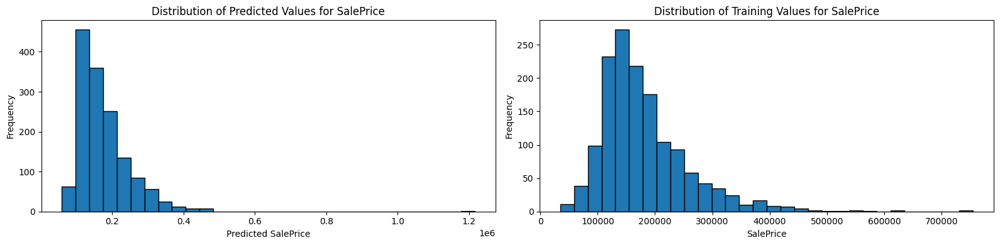

In [113]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# hist of predicted values
axes[0].hist(predictions, bins=30, edgecolor='k')
axes[0].set_title("Distribution of Predicted Values for SalePrice")
axes[0].set_xlabel("Predicted SalePrice")
axes[0].set_ylabel("Frequency")

# hist of training values
axes[1].hist(train_df["SalePrice"], bins=30, edgecolor='k')
axes[1].set_title("Distribution of Training Values for SalePrice")
axes[1].set_xlabel("SalePrice")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


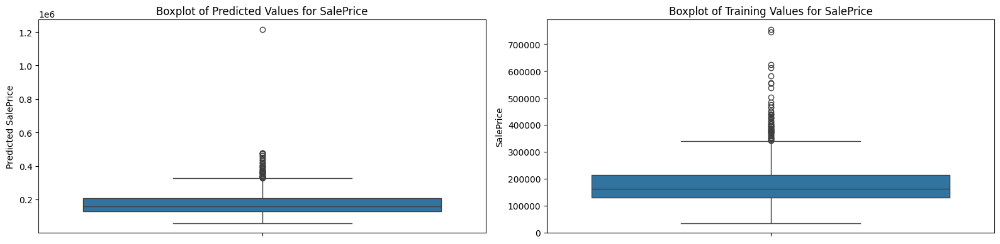

In [114]:
# boxplot
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# boxplot of predicted values
sns.boxplot(y=predictions, ax=axes[0])
axes[0].set_title("Boxplot of Predicted Values for SalePrice")
axes[0].set_ylabel("Predicted SalePrice")

# boxplot of training values
sns.boxplot(y=train_df["SalePrice"], ax=axes[1])
axes[1].set_title("Boxplot of Training Values for SalePrice")
axes[1].set_ylabel("SalePrice")

plt.tight_layout()
plt.show()


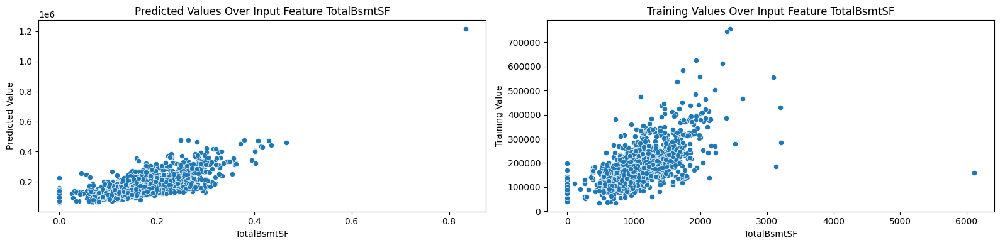

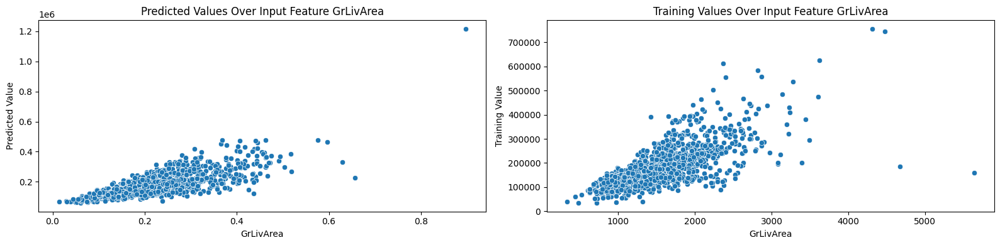

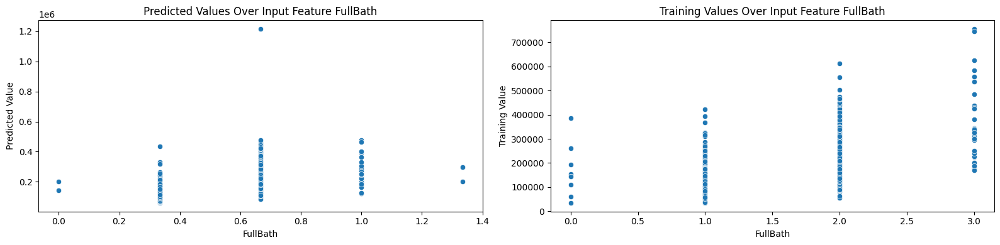

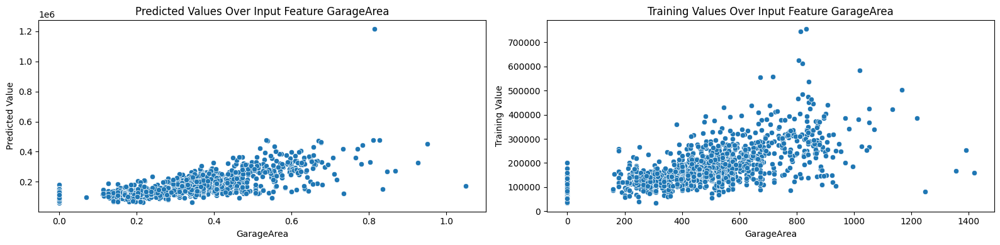

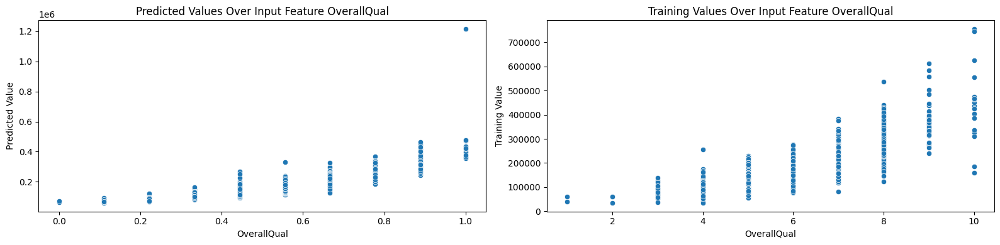

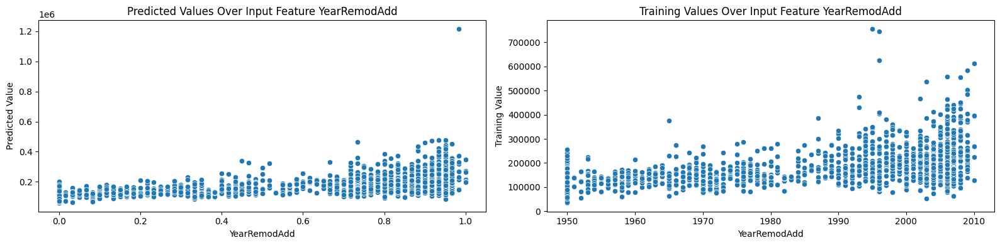

In [115]:
# feature wise analysis

for col in X_test.drop(columns="const").columns:
  fig, axes = plt.subplots(1, 2, figsize=(16, 4))

  sns.scatterplot(data=X_test, x=col, y=predictions, ax=axes[0])
  axes[0].set_title(f"Predicted Values Over Input Feature {col}")
  axes[0].set_xlabel(col)
  axes[0].set_ylabel("Predicted Value")

  sns.scatterplot(data=train_df, x=col, y='SalePrice', ax=axes[1])
  axes[1].set_title(f"Training Values Over Input Feature {col}")
  axes[1].set_xlabel(col)
  axes[1].set_ylabel("Training Value")

  plt.tight_layout()
  plt.show()


The predictions roughly follow the same patterns across features as with the training data set. The test dataset appears to have one outlying datapoint, both in terms of predictor values and the predicted SalePrice. The test dataset altogether shows less variance of SalePrice across features, which could indicate that the model potentially overfitted from the training data. Predictions are to be submitted to Kaggle for an evaluation by MSE to the true values of SalePrice by the dataset.

## Submitting Predictions to Kaggle

In [116]:
output = pd.DataFrame({'Id': test_df.Id,
                       'SalePrice': predictions})
output

,Id,SalePrice
0,1461,126736.494775
1,1462,142226.886049
2,1463,156733.961319
3,1464,173379.667982
4,1465,211015.475240
...,...,...
1454,2915,92110.748607
1455,2916,100808.973155
1456,2917,150408.554278
1457,2918,112902.288783


In [117]:
output.to_csv('/content/drive/My Drive/NU | MSDS 422 | Group 3/Assignments/Assignment 2: Housing Price Indicators/submission.csv', index=False)

Kaggle placed ranked these results 4565 out of 4795, with an RMSE of 0.46312. This model, as is, may act as a baseline model to provide a benchmark by which to improve scoring. Besides departing from regression analysis to different machine learning approaches, potential areas of improvement include fine tuning polynomial and GAM models, incorporating encoded categorical features, a more comprehensive way to address outliers and NULL values (imputation, SMOTE), and more rigorous analysis incorporating metrics like leverage.  